# 필수 코드 돌리기

In [ ]:
# # 구글 드라이브 마운트
# from google.colab import drive
# drive.mount('/content/drive')

# 라이브러리 불러오기
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import ast
import datetime
import re
import string
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer

from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings('ignore')

# CWD = os.getcwd()
# DATA_PATH = "/Users/jun/GitStudy/Data_4/Data/project5"
DATA_PATH = "/Users/jun/GitStudy/Data_4/Data/project/project5/gdrive/2.데이터"
# os.chdir(DATA_PATH)
# print("현재 경로: ", CWD)

# # pandas csv 읽어오는 함수
# def load_data(data_path, file):
#     path = os.path.join(data_path, file)
#     return pd.read_csv(path)



In [47]:
# 데이터셋 읽어오기
df = pd.read_csv('C:/Users/user/Desktop/databootcamp/tiktok_test/tiktoker_final_df_0127.csv')


In [48]:
# 전체적인 데이터 정보 EDA
def eda_overveiw(df):

    pd.set_option('display.max_rows', None)
    pd.set_option('display.max_columns', None)

    print(f"\n=================== DATA OVERVIEW ===================")

    # 데이터 상단부 확인
    print("\n----------------- Head -----------------")
    print(df.head())
    print("=" * 60)

    # 데이터 정보 및 크기 확인
    print("\n--------------- Information ---------------")
    print(df.info())
    print(f"\nSize: {df.size}")
    print(f"Shape: {df.shape}")
    print("=" * 60)

    # 결측치 확인
    print("\n--------------- Missing Values ---------------")
    print(df.isnull().sum())
    print("=" * 60)

    # 중복값 확인
    print("\n--------------- Duplicate Values ---------------")
    print(df.duplicated().value_counts())
    print("=" * 60)

    # 데이터 기술통계량 확인 (int, float type)
    print("\n------------ Descriptive Statistics (Numeric) ------------")
    print(df.describe())
    print("=" * 60)

    # 데이터 기술통계량 확인 (object type)
    print("\n------------ Descriptive Statistics (Categorical) ------------")

    try:
        print(df.describe(include=[object]))

    except:
        object_cols = df.select_dtypes(include=['object']).columns
        error_cols = []

        for col in object_cols:
            if df[col].apply(lambda x: isinstance(x, (list, dict))).any():
                error_cols.append(col)
        print(f"{error_cols} Excluded")
        print(df.loc[:, ~df.columns.isin(error_cols)].describe(include=[object]))

    print("=" * 60)

eda_overveiw(df)


=================== DATA OVERVIEW ===================

----------------- Head -----------------
         name  follower_cnt upload_date  view_cnt  like_cnt  comment_cnt  \
0  mydelicate      399800.0  2025-01-21      5158      1334           74   
1  mydelicate      399800.0  2025-01-18     24300      6606          246   
2  mydelicate      399800.0  2025-01-15     10400      1881           90   
3  mydelicate      399800.0  2025-01-14     22100      4206          193   
4  mydelicate      399800.0  2025-01-18     17200      2995          123   

   save_cnt                                           info_tag  \
0       175  my favourite blushes and why (with shades)💓 yo...   
1       917  spend a productive morning with me 💓🎀 why is i...   
2       218  for my girlies who still want to look cute whe...   
3       602  new Flower Knows strawberry cupid collection u...   
4       432  my favourite products for soft skin 🎀💓 names:\...   

                                            hash_

In [49]:
# 분석 & 전처리용으로 원본 데이터 복사
df_copy = df.copy()

In [50]:
# 언어 감지 및 번역을 위한 라이브러리: langdetect 간편하게 사용할 수 있어서 선택, Fasttext는 사전 학습된 모델을 다운 받아야 해서 미사용

from langdetect import detect, DetectorFactory
from langdetect.lang_detect_exception import LangDetectException
from deep_translator import GoogleTranslator

# 언어 감지
def detect_language(text):

    try:
        return detect(text)
    except LangDetectException:
        return 'unknown'

# 영어가 아닌 언어를 구글번역을 활용하여 영어로 번역
def translate_en(text):

    to_translate = text
    translated = GoogleTranslator(source='auto', target='english').translate(to_translate)

    return translated

def text_preprocessing(df) :
    # str 형식이 아닐 경우 오류 방지를 위한 코드
    df['info_tag'] = df['info_tag'].fillna('').astype(str)

    # 리뷰 언어가 영어가 아닌 경우 -> 번역
    #merge_df['detected_language'] = merge_df['review_content'].apply(detect_language)

    df['detected_language'] = df['info_tag'].apply(lambda x: detect_language(x) if isinstance(x, str) else None)
    df.loc[df['detected_language'] != 'en', 'info_tag'] = df.loc[df['detected_language'] != 'en', 'info_tag'].apply(translate_en)

    # merge_df.to_csv(DATA_PATH + "amazon_koreaOnly_translated.csv", encoding='utf-8')
    # df.rename(columns={'category':'Amazon_Category'}, inplace=True)
    # df['review_date'] = df['review_date'].apply(lambda x: pd.to_datetime(x) if not pd.isna(x) else None)
    # df['global_rating_count'] = df['global_rating_count'].astype('Int64')
    # df['Category_Rank'] = df['Category_Rank'].astype('Int64')
    # df['Sub_Category_Rank'] = df['Sub_Category_Rank'].astype('Int64')

    print(df.head(2))

# 브랜드 별 아이템, 리뷰 데이터 merge로 결합 후 리뷰데이터 번역 진행
# 시간이 다소 소요
text_preprocessing(df)

In [51]:
# nltk 에서 Punkt tokenizer & stopwords list를 다운로드
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [52]:
from nltk.util import ngrams
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()

stemmer = PorterStemmer()
stop_words = set(stopwords.words('english'))

# # # lda 모델링 추가 불용어
# lda_stopwords = [
#     "would", "use", "using","locals", "cf", "fb", "ba" , "line", "lines","formula", "formulas", "collection", "collections",
# "really","skin","used","time", "makes","tried","one","skin feel","lot","trying","buy","apply","quite","way","never","bought", "cosrx","always","less",
# "without","absolutely","might","maybe","sure","think","though", "getting","result","know", "especially","dr jart","feel","purchase","definitely",
# "im","thing","started","need","another","noticed","actually", "people","got","box","every","found","jart","wear",
# "set", "sets", "value", "values", "pack", "packs","new","ive"]

# # # K-beauty 추가 불용어
# kbeauty_stopwords =  [
# "and", "beauty", "skincare", "cosmetics", "product", "products", "from","for","im","i'm","floz",
#  "care", "makeup", "mask", "sheet","best", "top", "favorite",
# "amazing", "perfect", "review", "brand",
# "brands", "item", "items", "category", "categories", "ingredient", "ingredients",
# "set", "sets", "value", "values", "pack", "packs","latest", "exclusive", "limited",
# "special", "popular", "quality", "For",
# "safe", "worked", "works", " product"
# "face", "stuff","joseon",
# "dont","want","type","facial","money","nan","1","no","non","not", "drjart","to",
# "From" , "drjrt", "types", "of", "100ml","200ml","300ml","150ml","250ml","50ml","30ml", "338","507","676","purito","dr", "12", "100", "5", 
# '35', '•', '50', 'became', 'become', 'id', 'tag', 'film', 'ski', 'try', 'bag', 'ml', 'fl', 'oz', 'youre'
# ]

# 불용어 하나로 합치기
one_stopwords = [
"would", "use", "using","locals", "cf", "fb", "ba" , "line", "lines","formula", "formulas", "collection", "collections",
"really","skin","used","time", "makes","tried","one","skin feel","lot","trying","buy","apply","quite","way","never","bought", "cosrx","always","less",
"without","absolutely","might","maybe","sure","think","though", "getting","result","know", "especially","dr jart","feel","purchase","definitely",
"im","thing","started","need","another","noticed","actually", "people","got","box","every","found","jart","wear",
"set", "sets", "value", "values", "pack", "packs","new","ive", "and", "beauty", "skincare", "cosmetics", "product", "products", "from","for","im","i'm","floz",
"care", "makeup", "mask", "sheet","best", "top", "favorite","amazing", "perfect", "brand", "brands", "item", "items", "category", "categories", "ingredient", "ingredients",
"set", "sets", "value", "values", "pack", "packs","latest", "exclusive", "limited","special", "popular", "quality", "For","safe", "worked", "works", " product"
"face", "stuff","joseon", "dont","want","type","facial","money","nan","1","no","non","not", "drjart","to", "From" , "drjrt", "types", "of", "100ml","200ml","300ml","150ml","250ml",
"50ml","30ml", "338","507","676","purito","dr", "12", "100", "5", '35', '•', '50', 'became', 'become', 'id', 'tag', 'film', 'ski', 'try', 'bag', 'ml', 'fl', 'oz', 'youre',
'’', '”', 'skin', 'product', 'like', 'get', 'work',  'many', 'first', 'subject', 're', 'edu','object','generator','genexpr', 'much', 'little','bit','also','even', 'see','super','make','made','go',
'put','still','come','say','give','leave','keep','far','however','year','overall','left','take','highly','area','almost','two','could','breakout','break',
'fat','right','2','minute','seems','around','time','going','away','cause','leaving','nothing','back','ever','already','yet','star','part','liked','came',
'give','second','side','may','reaction','usually','3','next','full','job','looked','making','review','seem','big','kind','get','either',
'buying','thing','stay','said','hour','fan','jar','plus','add','“','gave','ordered','went','caused','others','point','twice','thats','added','end','someone',
'took','gone','let','anyone','amazon','order','able','seen','10','saw','else','one','burn','ill','test','fact','gon', 'coverage', 'cast', 'broke', 'quickly', 'bump', 'match',
'month', 'week', 'version', 'better', 'loved', 'holy', 'ok', 'prone', 'quickly', 'seoul', 'look', 'minute', 'amount', 'u', 'thought', 'korean', 'couple', 
'strong', 'cap', 'open', 'us', 'wife', 'unfortunately', 'everything', 'break', 'easily', 'puffiness', 'received', 'last', 'must', 'result', 'finish',
'list', 'inside', 'return', 'broken', 'mark', '21', 'star', 'opened', 'picture', 'waste', 'tret', 'sister', 'out', 'among', 'react', 'working', 'terribly', 'inci',
'patch', 'timeless', 'bump', 'one', 'theyre', 'combo', 'immediately', 'update', 'butter', 'problem', 'ratio', 'refill', 'interesting', 'label', 'whole', 'wave', 'nice', 'love', 'korea',
'expiration', 'date', 'english','it’s', 'i’m', 'i’ve', 'i’d','don’t', 'can’t', 'didn’t', 'doesn’t', 'won’t', 'isn’t', 'aren’t', 'wasn’t', 'weren’t', 'hasn’t', 'haven’t', 'hadn’t', 'shouldn’t',
'tbh', 'doesnt', 'stars', 'gag', 'within', 'well', 'bye', 'didnt', 'mine', 'imo', 'guess', 'i’ll', 'that’s', 'onto', 'nope', 'havent', 'bye', 'cannot', 'camo', 'besides', 'wouldn’t', 'gonna', 'within', 'soon', 'due', 'yea', 'cant', 'wowed', 'gal', 
'perhaps', 'me…', 'else’s', 'everyone’s', 'anything', 'jart’s', 'soon', 'things', 'that’s', 'thr', '010', 'idk', 'dud', 'couldn’t', 'omg', 'cant', 'isnt', 'it’ll', 'goes🙄', 'idk', 'justdidnt', 'josen', 'luthuli', 'cute…i', 'likely', 'shouldnt', 
'10th', 'mines', 'youd', 'yup', 'wouldn’t', 'upon', '798', 'etc', '“witch', '2023', 'purito’s', 'outs', 'brand’s' ]


stop_words = stopwords.words('english') + one_stopwords


# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):

        # 소문자로 모두 변환
        text = text.lower()

        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)

        # @ 제거
        text = re.sub(r'@\w+', '', text)

        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))

        return text
    else:
        return text

# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text

# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        return [word for word in tokens if word not in stop_words]
    else:
        return tokens

# (기존) stemming
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

# (추가) -> lemmatization 함수로 변경
def lemmatize_tokens(tokens):
    if isinstance(tokens, list):
        return [lemmatizer.lemmatize(token) for token in tokens]
    else:
        return tokens

# 저장
df['cleaned_info_tag'] = df['info_tag'].apply(clean_text)

df['tokenized_info_tag'] = df['cleaned_info_tag'].apply(tokenize_text)

df['stemmed_info_tag'] = df['tokenized_info_tag'].apply(stem_tokens)

df['stpw_processed_info_tag'] = df['tokenized_info_tag'].apply(remove_stopwords)

# bigram 하기 전
df['lemmatized_info_tag'] = df['stpw_processed_info_tag'].apply(lemmatize_tokens)

df.head(2) 

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info_tag,hash_tag,cleaned_info_tag,tokenized_info_tag,stemmed_info_tag,stpw_processed_info_tag,lemmatized_info_tag
0,mydelicate,399800.0,2025-01-21,5158,1334,74,175,my favourite blushes and why (with shades)💓 yo...,"@YesStyle,@House,#cbeauty,#koreanmakeup,#skinc...",my favourite blushes and why with shades💓 you ...,"[my, favourite, blushes, and, why, with, shade...","[my, favourit, blush, and, whi, with, shades💓,...","[favourite, blushes, shades💓, find, rewards, c...","[favourite, blush, shades💓, find, reward, cde,..."
1,mydelicate,399800.0,2025-01-18,24300,6606,246,917,spend a productive morning with me 💓🎀 why is i...,"#kbeauty,#morningroutine,#vlog,#wonyoungism,#s...",spend a productive morning with me 💓🎀 why is i...,"[spend, a, productive, morning, with, me, 💓🎀, ...","[spend, a, product, morn, with, me, 💓🎀, whi, i...","[spend, productive, morning, 💓🎀, hard, public,...","[spend, productive, morning, 💓🎀, hard, public,..."


In [53]:
# bigram 
bigram_measures = nltk.collocations.BigramAssocMeasures()
finder = nltk.collocations.BigramCollocationFinder.from_documents([comment.split() for comment in df.cleaned_info_tag if isinstance(comment, str)])

# # 불용어 제거 반영된 상태에서 진행
# finder.apply_word_filter(lambda w: w in stop_words)

# Filter only those that occur at least 50 times
finder.apply_freq_filter(50)
bigram_scores = finder.score_ngrams(bigram_measures.pmi)
bigram_scores[:10]

[(('•', '•'), 8.42193390354486),
 (('fyp', 'foryou'), 5.30518102005021),
 (('use', 'my'), 4.95618189283147),
 (('skincare', 'routine'), 4.816434471821008),
 (('wonyoungism', 'wonyoung'), 4.7838284057498655),
 (('skincare', 'skincareroutine'), 4.432093769765078),
 (('kbeauty', 'koreanskincare'), 3.4435030054947227),
 (('kbeauty', 'skincare'), 2.413402453705224)]

In [92]:
# trigram
trigram_measures = nltk.collocations.TrigramAssocMeasures()
finder = nltk.collocations.TrigramCollocationFinder.from_documents([comment.split() for comment in df.cleaned_info_tag if isinstance(comment, str)])
# finder.apply_word_filter(lambda w: w in stop_words)
# Filter only those that occur at least 50 times
finder.apply_freq_filter(20)
trigram_scores = finder.score_ngrams(trigram_measures.pmi)
trigram_scores[:50]

[(('haircarehacks', 'haircaretip', 'haircare101'), 21.183717809974343),
 (('haircareproducts', 'haircarehacks', 'haircaretip'), 21.020219077691465),
 (('haircaretips', 'haircareproducts', 'haircarehacks'), 20.963635549325097),
 (('10xhealth', 'healthylifestyle', 'healthandwellness'), 20.75546819926865),
 (('cleangirlhacks', 'signaturelook', 'luxurylifestyle'), 20.75546819926865),
 (('luxurylifestyle', 'luxuryaesthetic', 'declutter'), 20.75546819926865),
 (('selfdevelopment', 'selfimprovement', 'selfcaretips'), 20.75546819926865),
 (('signaturelook', 'luxurylifestyle', 'luxuryaesthetic'), 20.75546819926865),
 (('declutter', 'declutterchallenge', '10xhealth'), 20.755468199268645),
 (('declutterchallenge', '10xhealth', 'healthylifestyle'), 20.755468199268645),
 (('luxuryaesthetic', 'declutter', 'declutterchallenge'), 20.755468199268645),
 (('bodycareproducts', 'bodycaretips', 'bodycareviral'), 20.7065585987877),
 (('cleangirlaesthetic', 'cleangirlhacks', 'signaturelook'), 20.7065585987877

In [93]:
bigram_pmi = pd.DataFrame(bigram_scores)
bigram_pmi.columns = ['bigram', 'pmi']
bigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

trigram_pmi = pd.DataFrame(trigram_scores)
trigram_pmi.columns = ['trigram', 'pmi']
trigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

In [94]:
# Filter for bigrams with only noun-type structures
def bigram_filter(bigram):
    tag = nltk.pos_tag(bigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['NN']:
        return False
    if bigram[0] in stop_words or bigram[1] in stop_words:
        return False
    if 'n' in bigram or 't' in bigram:
        return False
    if 'PRON' in bigram:
        return False
    return True

# Filter for trigrams with only noun-type structures
def trigram_filter(trigram):
    tag = nltk.pos_tag(trigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['JJ','NN']:
        return False
    if trigram[0] in stop_words or trigram[-1] in stop_words or trigram[1] in stop_words:
        return False
    if 'n' in trigram or 't' in trigram:
        return False
    if 'PRON' in trigram:
        return False
    return True 

In [57]:
import nltk
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


True

In [58]:
nltk.download('popular')

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |   

True

In [59]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [96]:
# Can set pmi threshold to whatever makes sense - eyeball through and select threshold where n-grams stop making sense
# choose top 500 ngrams in this case ranked by PMI that have noun like structures
filtered_bigram = bigram_pmi[bigram_pmi.apply(lambda bigram:\
                                            bigram_filter(bigram['bigram'])\
                                            and bigram.pmi > 5, axis = 1)][:500]

filtered_trigram = trigram_pmi[trigram_pmi.apply(lambda trigram: \
                                            trigram_filter(trigram['trigram'])\
                                                and trigram.pmi > 5, axis = 1)][:500]

bigrams = [' '.join(x) for x in filtered_bigram.bigram.values if len(x[0]) > 2 or len(x[1]) > 2]
trigrams = [' '.join(x) for x in filtered_trigram.trigram.values if len(x[0]) > 2 or len(x[1]) > 2 and len(x[2]) > 2]

In [97]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

info_tag_w_ngrams = pd.DataFrame(df.cleaned_info_tag.copy())
info_tag_w_ngrams.cleaned_info_tag = info_tag_w_ngrams.cleaned_info_tag.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
info_tag_w_ngrams = info_tag_w_ngrams.cleaned_info_tag.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
info_tag_w_ngrams.dropna(axis=0, inplace=True)
info_tag_w_ngrams.isnull().sum()

info_tag_w_ngrams.head()
final_reviews = info_tag_w_ngrams.copy()

In [98]:
from collections import Counter

word_counts = Counter(" ".join([" ".join(review) for review in df['lemmatized_info_tag'].dropna()]).split())
common_words = word_counts.most_common(500)  # 가장 많이 등장하는 50개 단어 확인
print(common_words)

[('kbeauty', 691), ('fyp', 491), ('wonyoungism', 480), ('koreanskincare', 426), ('yesstyle', 228), ('code', 212), ('skincareroutine', 180), ('wonyoung', 178), ('aesthetic', 166), ('foryou', 159), ('routine', 153), ('glassskin', 145), ('vlog', 139), ('pink', 138), ('skincaretips', 136), ('asmr', 113), ('serum', 110), ('global', 108), ('cute', 104), ('official', 102), ('koreanmakeup', 101), ('grwm', 95), ('fypシ', 91), ('yesstyleinfluencers', 90), ('selfcare', 86), ('glow', 85), ('foryoupage', 85), ('unboxing', 84), ('hair', 80), ('viral', 79), ('haul', 76), ('cream', 76), ('beautytips', 76), ('coquette', 75), ('discount', 73), ('cleanbeauty', 73), ('christmas', 72), ('lip', 71), ('kpop', 71), ('koreanbeauty', 64), ('oliveyoung', 64), ('pore', 62), ('glowyskin', 62), ('kbeautyskincare', 60), ('morningroutine', 59), ('skincare101', 58), ('stylevana', 58), ('cbeauty', 57), ('skintok', 56), ('targetaudience', 56), ('toner', 55), ('selfcareroutine', 55), ('blush', 54), ('day', 52), ('cleanser

## 필수 코드 (위까지 실행하기)

## 바이그램, 트리그램(선택)

In [16]:
# bigram 
bigram_measures = nltk.collocations.BigramAssocMeasures()
finder = nltk.collocations.BigramCollocationFinder.from_documents([comment.split() for comment in amazon_df.cleaned_review if isinstance(comment, str)])

# # 불용어 제거 반영된 상태에서 진행
# finder.apply_word_filter(lambda w: w in stop_words)

# Filter only those that occur at least 50 times
finder.apply_freq_filter(50)
bigram_scores = finder.score_ngrams(bigram_measures.pmi)
bigram_scores[:10]

[(('holy', 'grail'), 13.083213993423971),
 (('fl', 'oz'), 12.9738460041687),
 (('expiration', 'date'), 12.896128440823476),
 (('play', 'video'), 12.763490672245355),
 (('tea', 'tree'), 11.727446606231798),
 (('centella', 'asiatica'), 11.420961186408691),
 (('cotton', 'pad'), 11.326168103441569),
 (('vitamin', 'c'), 11.318545470467917),
 (('dark', 'circles'), 11.202231568549157),
 (('white', 'cast'), 11.11640275564492)]

In [17]:
# trigram
trigram_measures = nltk.collocations.TrigramAssocMeasures()
finder = nltk.collocations.TrigramCollocationFinder.from_documents([comment.split() for comment in amazon_df.cleaned_review if isinstance(comment, str)])
# finder.apply_word_filter(lambda w: w in stop_words)
# Filter only those that occur at least 50 times
finder.apply_freq_filter(50)
trigram_scores = finder.score_ngrams(trigram_measures.pmi)
trigram_scores[:10]

[(('vitamin', 'c', 'serum'), 18.002041692787476),
 (('beauty', 'of', 'joseon'), 17.699105063341985),
 (('dr', 'jart', 'products'), 17.241699618282404),
 (('made', 'in', 'korea'), 15.700441613476833),
 (('a', 'white', 'cast'), 15.12735108545009),
 (('broke', 'me', 'out'), 14.897953971282224),
 (('as', 'soon', 'as'), 14.469669856482273),
 (('the', 'snail', 'mucin'), 14.298300171032459),
 (('acne', 'prone', 'skin'), 14.218267443366464),
 (('ive', 'been', 'using'), 14.139254054213026)]

In [18]:
bigram_pmi = pd.DataFrame(bigram_scores)
bigram_pmi.columns = ['bigram', 'pmi']
bigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

trigram_pmi = pd.DataFrame(trigram_scores)
trigram_pmi.columns = ['trigram', 'pmi']
trigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

In [19]:
# Filter for bigrams with only noun-type structures
def bigram_filter(bigram):
    tag = nltk.pos_tag(bigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['NN']:
        return False
    if bigram[0] in stop_words or bigram[1] in stop_words:
        return False
    if 'n' in bigram or 't' in bigram:
        return False
    if 'PRON' in bigram:
        return False
    return True

# Filter for trigrams with only noun-type structures
def trigram_filter(trigram):
    tag = nltk.pos_tag(trigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['JJ','NN']:
        return False
    if trigram[0] in stop_words or trigram[-1] in stop_words or trigram[1] in stop_words:
        return False
    if 'n' in trigram or 't' in trigram:
        return False
    if 'PRON' in trigram:
        return False
    return True 

In [30]:
import nltk
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger_eng.zip.


True

In [24]:
nltk.download('popular')

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\cmudict.zip.
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\gazetteers.zip.
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\genesis.zip.
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\gutenberg.zip.
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     C:\Users\user\AppData\Roaming\nltk_dat

True

In [22]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger.zip.


True

In [31]:
# Can set pmi threshold to whatever makes sense - eyeball through and select threshold where n-grams stop making sense
# choose top 500 ngrams in this case ranked by PMI that have noun like structures
filtered_bigram = bigram_pmi[bigram_pmi.apply(lambda bigram:\
                                            bigram_filter(bigram['bigram'])\
                                            and bigram.pmi > 5, axis = 1)][:500]

filtered_trigram = trigram_pmi[trigram_pmi.apply(lambda trigram: \
                                            trigram_filter(trigram['trigram'])\
                                                and trigram.pmi > 5, axis = 1)][:500]

bigrams = [' '.join(x) for x in filtered_bigram.bigram.values if len(x[0]) > 2 or len(x[1]) > 2]
trigrams = [' '.join(x) for x in filtered_trigram.trigram.values if len(x[0]) > 2 or len(x[1]) > 2 and len(x[2]) > 2]

In [32]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

reviews_w_ngrams = pd.DataFrame(amazon_df.cleaned_review.copy())
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.cleaned_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
reviews_w_ngrams = reviews_w_ngrams.cleaned_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

reviews_w_ngrams.head()
final_reviews = reviews_w_ngrams.copy()

## 테스트 코드

In [99]:
# ! pip install pyLDAvis

import gensim
from gensim.utils import simple_preprocess
import gensim.corpora as corpora
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from gensim import corpora
from pprint import pprint
import pyLDAvis.gensim
import pickle
import pyLDAvis

## 브랜드별 평점 4점 이상

## 브랜드별 평점 2점 이하 전체랑 브랜드별

In [101]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

In [102]:
# 브랜드 이름별로 그룹화
grouped = df.groupby('name')

# 각 브랜드에 대한 데이터프레임을 딕셔너리 형태로 나누기
tiktoker_dfs = {brand: data for brand, data in grouped}

# 결과 확인
tiktoker_dfs['velcroluv'].head(3)  # 예시로 'mydelicate' 브랜드 데이터프레임 출력

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info_tag,hash_tag,cleaned_info_tag,tokenized_info_tag,stemmed_info_tag,stpw_processed_info_tag,lemmatized_info_tag
30,velcroluv,114500.0,2025-01-21,8869,388,30,77,Wonyoungism Pretty princess lifestyle mini vlo...,"#wonyoungism,#fyp,#kbeauty,#routine,#vlog,#korean",wonyoungism pretty princess lifestyle mini vlo...,"[wonyoungism, pretty, princess, lifestyle, min...","[wonyoung, pretti, princess, lifestyl, mini, v...","[wonyoungism, pretty, princess, lifestyle, min...","[wonyoungism, pretty, princess, lifestyle, min..."
31,velcroluv,114500.0,2025-01-20,4895,2791,162,577,Night skincare routine with Eleeni! ASMR versi...,"#wonyoungism,#fyp,#kbeauty,#koreanskincare,#ro...",night skincare routine with eleeni asmr versio...,"[night, skincare, routine, with, eleeni, asmr,...","[night, skincar, routin, with, eleeni, asmr, v...","[night, routine, eleeni, asmr, mind, wet, hair...","[night, routine, eleeni, asmr, mind, wet, hair..."
32,velcroluv,114500.0,2025-01-19,24400,1146,62,202,Mixsoon sunscreen centella spf50+! Serum-like ...,"@Mixsoon,#kbeauty,#wonyoungism,#fyp,#koreanski...",mixsoon sunscreen centella spf50 serumlike sun...,"[mixsoon, sunscreen, centella, spf50, serumlik...","[mixsoon, sunscreen, centella, spf50, serumlik...","[mixsoon, sunscreen, centella, spf50, serumlik...","[mixsoon, sunscreen, centella, spf50, serumlik..."


In [ ]:
info_tag_w_ngrams_dict = {}

# 각 브랜드에 대한 info_tag 추출
brand_names = ['mydelicate', 'velcroluv', 'caspertheghostyy', 'bwnniewony', 'aeiezo.pdf',
               'milkydew', 'emchu_', 'songofskin', '4chriisty', '.blissdiaries', 'dearwonii_',
               'olafflee', 'jasminnlily_', '_luvwonsnnx', 'koocat', 'jeb_bi', '.m.egan', 'jaerini',
               'onlydahia', 'saeroniee', 'moonskinclub', 'heartsfor.kbeauty', 'ririsglow_', 'thelipstickgirly',
               'gae4hrv', '__.annie.s', 'cleanlivingkarly', 'aylennpark', 'itsedonna', 'cleangirlhacks',
               'danicolexx', 'tracyy_s', 'haruqhxz', 'krystallee2222', 'ooolongmilkteaa', 'kwyeona',
               'vanessafaga', 'izzydiaries', 'luvsfor.jennie', 'glowupwithinah', 'its.kaylas', 'widyaatharva01',
               'rosiehashs', 'asiamelon', 'ameenbeautytips', 'lovelymiri05', 'monakoaa', 'ayheyt3u',
               'soft.milky.latte', 'misscasxie', 'woniluv', 'ofeemi7', 'nana.tan07', 'minseonk1m', 'fromh1ae_',
               'amyflamy1']

# 각 브랜드별로 cleaned_info_tag를 추출해서 딕셔너리에 저장
for brand in brand_names:
    if brand in brand_dfs:
        info_tag_w_ngrams_dict[brand] = pd.DataFrame(brand_dfs[brand].cleaned_info_tag.copy())



In [73]:
# # #모든 틱톡커
# info_tag_w_ngrams = pd.DataFrame(df.cleaned_info_tag.copy())

# # # 틱톡커 개인별 df
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['mydelicate'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['velcroluv'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['caspertheghostyy'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['bwnniewony'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['aeiezo.pdf'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['milkydew'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['emchu_'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['songofskin'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['4chriisty'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['.blissdiaries'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['dearwonii_'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['olafflee'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['jasminnlily_'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['_luvwonsnnx'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['koocat'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['jeb_bi'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['.m.egan'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['jaerini'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['onlydahia'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['saeroniee'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['moonskinclub'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['heartsfor.kbeauty'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['ririsglow_'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['thelipstickgirly'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['gae4hrv'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['__.annie.s'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['cleanlivingkarly'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['aylennpark'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['itsedonna'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['cleangirlhacks'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['danicolexx'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['tracyy_s'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['haruqhxz'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['krystallee2222'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['ooolongmilkteaa'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['kwyeona'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['vanessafaga'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['izzydiaries'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['luvsfor.jennie'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['glowupwithinah'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['its.kaylas'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['widyaatharva01'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['rosiehashs'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['asiamelon'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['ameenbeautytips'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['lovelymiri05'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['monakoaa'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['ayheyt3u'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['soft.milky.latte'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['misscasxie'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['woniluv'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['ofeemi7'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['nana.tan07'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['minseonk1m'].cleaned_info_tag.copy())
# info_tag_w_ngrams = pd.DataFrame(brand_dfs['fromh1ae_'].cleaned_info_tag.copy())

# info_tag_w_ngrams = pd.DataFrame(brand_dfs['amyflamy1'].cleaned_info_tag.copy())

In [85]:
info_tag_w_ngrams

150    [matcha, helps, acne, matcha, skintok, diyskin...
151    [eat, morning❤️chinese, secret, jujube, dates,...
152    [pimple, brb, chugging, gallon, water, skintok...
153    [gua, sha, frozen, strawberry🍓✨, guasha, acne,...
154    [ate, ramens, 2am, night, before😭sooo, lifting...
155    [giveaway, we’re, tiktok🤎a, coffee, day, keeps...
156    [balance😌i, miss, convenience, stores, clearsk...
157    [forget, sunscreen, winter, 🩵global, poredark,...
158    [matcha, binghulu, tanghulu, strawberry, match...
159    [helps, brighten, teeth………………………………………………guys,...
160    [days, 🍊🧡✨, serum, sensitive, types✨, innisfre...
161    [suppose, proper, now😡, relatable, skintok, ko...
162    [tip, cleansers, preshampoo, treatment🤍, ricem...
163    [eat, glowing, skin✨, jumiso, hyaluronicacid, ...
164    [homemade, dark, chocolate, strawberry, health...
165    [y’all, asking, acne, olds, snail, mucin, pept...
166    [days, dry, sensitive, acne, skin🤍🤍🤍, skinitif...
167    [longer, gate, keeping, 

In [84]:
info_tag_w_ngrams.columns

AttributeError: 'Series' object has no attribute 'columns'

In [89]:
info_tag_w_ngrams_dict.values()

dict_values([                                     cleaned_info_tag
0   my favourite blushes and why with shades💓 you ...
1   spend a productive morning with me 💓🎀 why is i...
2   for my girlies who still want to look cute whe...
3   new flower knows strawberry cupid collection u...
4   my favourite products for soft skin 🎀💓 names\n...
5   doing this healed my inner child and it looks ...
6   my favourite winter oufits from  ❄️🐰💕 you can ...
7   tiktok is getting banned in the us 😥 for my us...
8   jolse beauty box haul 💓✨ miniskirt is trending...
9   study with me 🎀🐰 i just started my finals agai...
10  search code 8kgbl 💓 i finally have mugs my cat...
11  i am finally free of having to carry around th...
12  feeling like a princess while doing my skincar...
13  glass hair hack to get shiny and soft hair 💕 m...
14  happy new year 💓 the other day i tried the vir...
15  this is your sign to start wonyoungism this 20...
16  new beauty release 💓 healing my inner child wi...
17  long awaite

In [ ]:
info_tag_w_ngrams_dict = {}

# 각 브랜드에 대한 info_tag 추출
tiktoker_names = ['mydelicate', 'velcroluv', 'caspertheghostyy', 'bwnniewony', 'aeiezo.pdf',
               'milkydew', 'emchu_', 'songofskin', '4chriisty', '.blissdiaries', 'dearwonii_',
               'olafflee', 'jasminnlily_', '_luvwonsnnx', 'koocat', 'jeb_bi', '.m.egan', 'jaerini',
               'onlydahia', 'saeroniee', 'moonskinclub', 'heartsfor.kbeauty', 'ririsglow_', 'thelipstickgirly',
               'gae4hrv', '__.annie.s', 'cleanlivingkarly', 'aylennpark', 'itsedonna', 'cleangirlhacks',
               'danicolexx', 'tracyy_s', 'haruqhxz', 'krystallee2222', 'ooolongmilkteaa', 'kwyeona',
               'vanessafaga', 'izzydiaries', 'luvsfor.jennie', 'glowupwithinah', 'its.kaylas', 'widyaatharva01',
               'rosiehashs', 'asiamelon', 'ameenbeautytips', 'lovelymiri05', 'monakoaa', 'ayheyt3u',
               'soft.milky.latte', 'misscasxie', 'woniluv', 'ofeemi7', 'nana.tan07', 'minseonk1m', 'fromh1ae_',
               'amyflamy1']

# 각 브랜드별로 cleaned_info_tag를 추출해서 딕셔너리에 저장
for tiktoker in tiktoker_names:
    if tiktoker in tiktoker_dfs:
        info_tag_w_ngrams_dict[tiktoker] = pd.DataFrame(tiktoker_dfs[tiktoker].cleaned_info_tag.copy())
        print('틱톡커 이름:',tiktoker)

    #두개 이어 붙인 거 이_로
    #info_tag_w_ngrams.cleaned_info_tag = info_tag_w_ngrams.cleaned_info_tag.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

    info_tag_w_ngrams['cleaned_info_tag'] = info_tag_w_ngrams['cleaned_info_tag'].map(
            lambda x: replace_ngram(x) if isinstance(x, str) else x
        )

    # 불용어 처리 추가
    print(stop_words)

    # 3개 짜리 트리그램 [word1, word2, word3] + 두이어붙인 거에
    info_tag_w_ngrams = info_tag_w_ngrams.cleaned_info_tag.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
    info_tag_w_ngrams.dropna(axis=0, inplace=True)
    info_tag_w_ngrams.isnull().sum()

    final_reviews = info_tag_w_ngrams
    final_reviews.dropna(axis=0, inplace=True)

    dictionary = corpora.Dictionary(final_reviews)
    doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

    coherence = []
    umass = []
    px = []

    for k in range(3,9):
        print('Round: '+str(k))
        Lda = gensim.models.ldamodel.LdaModel
        ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                    iterations=200, chunksize = 10000, eval_every = None, random_state=0)
        
        cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                        dictionary=dictionary, coherence='c_v')
        mm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                        dictionary=dictionary, coherence='u_mass')
        coherence.append((k,cm.get_coherence()))
        umass.append((k,mm.get_coherence()))
        
        
    x_val = [x[0] for x in coherence]
    y_val = [x[1] for x in coherence]

    x_val_u = [x[0] for x in umass]
    y_val_y = [x[1] for x in umass]

    plt.subplot(1,2,1)
    plt.plot(x_val,y_val)
    plt.scatter(x_val,y_val)
    plt.title('Number of Topics vs. Coherence')
    plt.xlabel('Number of Topics')
    plt.ylabel('c_v')
    plt.xticks(x_val)
    plt.show()

    plt.subplot(1,2,2)
    plt.plot(x_val_u,y_val_y)
    plt.scatter(x_val_u,y_val_y)
    plt.title('Number of Topics vs. Coherence')
    plt.xlabel('Number of Topics')
    plt.ylabel('u_mass')
    plt.xticks(x_val_u)
    plt.show()

틱톡커 이름: mydelicate


KeyError: 'cleaned_info_tag'

In [77]:
info_tag_w_ngrams_dict = {}

# 각 브랜드에 대한 info_tag 추출
tiktoker_names = ['mydelicate', 'velcroluv', 'caspertheghostyy', 'bwnniewony', 'aeiezo.pdf',
               'milkydew', 'emchu_', 'songofskin', '4chriisty', '.blissdiaries', 'dearwonii_',
               'olafflee', 'jasminnlily_', '_luvwonsnnx', 'koocat', 'jeb_bi', '.m.egan', 'jaerini',
               'onlydahia', 'saeroniee', 'moonskinclub', 'heartsfor.kbeauty', 'ririsglow_', 'thelipstickgirly',
               'gae4hrv', '__.annie.s', 'cleanlivingkarly', 'aylennpark', 'itsedonna', 'cleangirlhacks',
               'danicolexx', 'tracyy_s', 'haruqhxz', 'krystallee2222', 'ooolongmilkteaa', 'kwyeona',
               'vanessafaga', 'izzydiaries', 'luvsfor.jennie', 'glowupwithinah', 'its.kaylas', 'widyaatharva01',
               'rosiehashs', 'asiamelon', 'ameenbeautytips', 'lovelymiri05', 'monakoaa', 'ayheyt3u',
               'soft.milky.latte', 'misscasxie', 'woniluv', 'ofeemi7', 'nana.tan07', 'minseonk1m', 'fromh1ae_',
               'amyflamy1']

# 각 브랜드별로 cleaned_info_tag를 추출해서 딕셔너리에 저장
for tiktoker in tiktoker_names:
    if tiktoker in tiktoker_dfs:
        info_tag_w_ngrams_dict[tiktoker] = pd.DataFrame(tiktoker_dfs[tiktoker].cleaned_info_tag.copy())
        print('틱톡커 이름:',tiktoker)
        
    for i in range(2,3):
        name = 'dsa_all'
        num = i
        Lda = gensim.models.ldamodel.LdaModel
        ldamodel = Lda(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                    iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

        Lda2 = gensim.models.ldamodel.LdaModel
        ldamodel2 = Lda2(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                    iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

        # To show initial topics
        ldamodel.show_topics(num, num_words=10, formatted=False)

        # To show initial topics
        ldamodel2.show_topics(num, num_words=10, formatted=False)

        # Visualize the topics
        pyLDAvis.enable_notebook()
        LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

        # Create directory if it does not exist
        if not os.path.exists('./results'):
            os.makedirs('./results')

        LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
        with open(LDAvis_data_filepath, 'wb') as f:
            pickle.dump(LDAvis_prepared, f)
        # load the pre-prepared pyLDAvis data from disk

        with open(LDAvis_data_filepath, 'rb') as f:
            LDAvis_prepared = pickle.load(f)
        pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ f'{name}_{num}' +'.html')
        display(LDAvis_prepared)

        topic_data = LDAvis_prepared
        all_topics = {}
        num_terms = 10  # Adjust number of words to represent each topic
        lambd = 0.6  # Adjust this accordingly based on tuning above

        for j in range(1, num + 1):  # Adjust this to reflect number of topics chosen for final LDA model
            topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic' + str(j)].copy()
            topic['relevance'] = topic['loglift'] * (1 - lambd) + topic['logprob'] * lambd
            
            # 리스트 길이 보정: max_length 만큼 패딩 (NaN 추가)
            terms = topic.sort_values(by='relevance', ascending=False).Term.tolist()
            all_topics['Topic ' + str(j)] = terms[:num_terms] + [None] * (num_terms - len(terms))

        lda2_test_results = pd.DataFrame.from_dict(all_topics, orient='index')
        display(lda2_test_results)

틱톡커 이름: mydelicate


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: velcroluv


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: caspertheghostyy


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: bwnniewony


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: aeiezo.pdf


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: milkydew


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: emchu_


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: songofskin


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: 4chriisty


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: .blissdiaries


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: dearwonii_


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: olafflee


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: jasminnlily_


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: _luvwonsnnx


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: koocat


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: jeb_bi


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: .m.egan


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: jaerini


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
0      0.06512  0.0       1        1  57.450333
1     -0.06512  0.0       2        1  42.549667, topic_info=                Term      Freq      Total Category  logprob  loglift
91           retinal  2.000000   2.000000  Default  30.0000  30.0000
266           orange  4.000000   4.000000  Default  29.0000  29.0000
72        caffetinal  2.000000   2.000000  Default  28.0000  28.0000
83             kaine  2.000000   2.000000  Default  27.0000  27.0000
132        sunscreen  2.000000   2.000000  Default  26.0000  26.0000
268            peels  3.000000   3.000000  Default  25.0000  25.0000
278              tea  3.000000   3.000000  Default  24.0000  24.0000
119     winterseason  3.000000   3.000000  Default  23.0000  23.0000
2          clearskin  5.000000   5.000000  Default  22.0000  22.0000
76             cream  1.000000   1.000000  Default  21.0000  21.0000
73            coffee  1.000000   1.000000  Default  20.0000  20.0000
102          winners  1.000000   1.000000  Default  19.0000  19.0000
229            y’all  1.000000   1.000000  Default  18.0000  18.0000
331            viral  1.000000   1.000000  Default  17.0000  17.0000
123          celimax  1.000000   1.000000  Default  16.0000  16.0000
317           global  1.000000   1.000000  Default  15.0000  15.0000
319             shot  1.000000   1.000000  Default  14.0000  14.0000
197          glowing  1.000000   1.000000  Default  13.0000  13.0000
199           jumiso  1.000000   1.000000  Default  12.0000  12.0000
38            pimple  1.000000   1.000000  Default  11.0000  11.0000
162      theordinary  1.000000   1.000000  Default  10.0000  10.0000
7              honey  2.000000   2.000000  Default   9.0000   9.0000
277            taste  2.000000   2.000000  Default   8.0000   8.0000
23            secret  2.000000   2.000000  Default   7.0000   7.0000
104            ✨ends  1.000000   1.000000  Default   6.0000   6.0000
93       skincare101  1.000000   1.000000  Default   5.0000   5.0000
77         creampuff  1.000000   1.000000  Default   4.0000   4.0000
85      kbeautyviral  1.000000   1.000000  Default   3.0000   3.0000
68           account  1.000000   1.000000  Default   2.0000   2.0000
90           receive  1.000000   1.000000  Default   1.0000   1.0000
266           orange  4.142279   4.427642   Topic1  -4.4429   0.4876
268            peels  2.867643   3.153001   Topic1  -4.8106   0.4594
278              tea  2.867642   3.153001   Topic1  -4.8106   0.4594
119     winterseason  2.866912   3.152923   Topic1  -4.8109   0.4592
7              honey  2.229863   2.515631   Topic1  -5.0622   0.4337
277            taste  2.229590   2.515602   Topic1  -5.0623   0.4336
23            secret  2.229574   2.515601   Topic1  -5.0623   0.4335
2          clearskin  4.802838   5.637629   Topic1  -4.2949   0.3940
256           ginger  1.593004   1.878359   Topic1  -5.3985   0.3895
275         squeezed  1.593004   1.878359   Topic1  -5.3985   0.3895
255          freshly  1.593004   1.878359   Topic1  -5.3985   0.3895
253             cups  1.593004   1.878359   Topic1  -5.3985   0.3895
27       xiaohongshu  1.592757   1.878333   Topic1  -5.3986   0.3893
139         binghulu  1.592625   1.878319   Topic1  -5.3987   0.3893
154       strawberry  1.592596   1.878316   Topic1  -5.3988   0.3892
145        easysnack  1.592596   1.878316   Topic1  -5.3988   0.3892
149             help  1.592596   1.878316   Topic1  -5.3988   0.3892
114    orangepeeltea  1.592584   1.878315   Topic1  -5.3988   0.3892
108       chinesetea  1.592584   1.878315   Topic1  -5.3988   0.3892
204        chocolate  1.592565   1.878313   Topic1  -5.3988   0.3892
25          skinfood  1.592536   1.878310   Topic1  -5.3988   0.3892
20            jujube  1.592509   1.878307   Topic1  -5.3988   0.3892
280            throw  1.592491   1.878305   Topic1  -5.3988   0.3892
274       skinhealth  1.592487   1.8783

,0,1,2,3,4,5,6,7,8,9
Topic 1,koreanskincare,skintok,clearskin,guthealth,orange,matcha,glassskin,peels,tea,winterseason
Topic 2,skintok,koreanskincare,retinal,acne,kaine,caffetinal,sunscreen,cream,coffee,winners


틱톡커 이름: onlydahia


KeyboardInterrupt: 

In [118]:
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa.cleaned_review.copy())
reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_dr.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_cs.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_bj.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_if.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_pu.cleaned_review.copy())

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

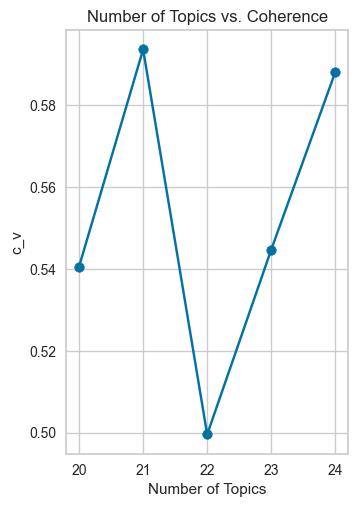

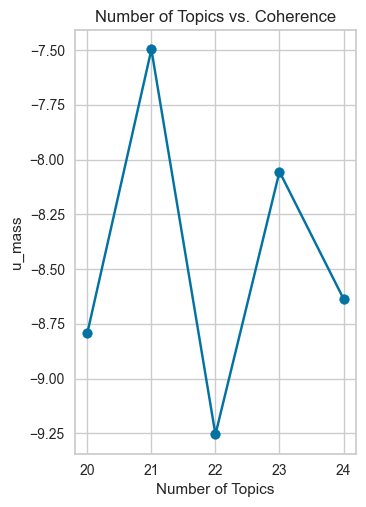

In [119]:
#두개 이어 붙인 거 이_로
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.cleaned_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# 불용어 처리 추가
print(stop_words)

# 3개 짜리 트리그램 [word1, word2, word3] + 두이어붙인 거에
reviews_w_ngrams = reviews_w_ngrams.cleaned_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
umass = []
px = []

for k in range(20,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                iterations=200, chunksize = 10000, eval_every = None, random_state=0)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='c_v')
    mm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='u_mass')
    coherence.append((k,cm.get_coherence()))
    umass.append((k,mm.get_coherence()))
    
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

x_val_u = [x[0] for x in umass]
y_val_y = [x[1] for x in umass]

plt.subplot(1,2,1)
plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('c_v')
plt.xticks(x_val)
plt.show()

plt.subplot(1,2,2)
plt.plot(x_val_u,y_val_y)
plt.scatter(x_val_u,y_val_y)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('u_mass')
plt.xticks(x_val_u)
plt.show()

In [120]:
for i in range(20,25):
    name = 'dr'
    num = i
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    Lda2 = gensim.models.ldamodel.LdaModel
    ldamodel2 = Lda2(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    # To show initial topics
    ldamodel.show_topics(num, num_words=10, formatted=False)

    # To show initial topics
    ldamodel2.show_topics(num, num_words=10, formatted=False)

    # Visualize the topics
    pyLDAvis.enable_notebook()
    LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

    # Create directory if it does not exist
    if not os.path.exists('./results'):
        os.makedirs('./results')

    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
    # load the pre-prepared pyLDAvis data from disk

    with open(LDAvis_data_filepath, 'rb') as f:
        LDAvis_prepared = pickle.load(f)
    pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ f'{name}_{num}' +'.html')
    display(LDAvis_prepared)

    topic_data = LDAvis_prepared
    all_topics = {}
    num_terms = 10  # Adjust number of words to represent each topic
    lambd = 0.6  # Adjust this accordingly based on tuning above

    for j in range(1, num + 1):  # Adjust this to reflect number of topics chosen for final LDA model
        topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic' + str(j)].copy()
        topic['relevance'] = topic['loglift'] * (1 - lambd) + topic['logprob'] * lambd
        
        # 리스트 길이 보정: max_length 만큼 패딩 (NaN 추가)
        terms = topic.sort_values(by='relevance', ascending=False).Term.tolist()
        all_topics['Topic ' + str(j)] = terms[:num_terms] + [None] * (num_terms - len(terms))

    lda2_test_results = pd.DataFrame.from_dict(all_topics, orient='index')
    display(lda2_test_results)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9      0.030642 -0.191628       1        1  12.208412
15     0.138547  0.158669       2        1  10.467039
16     0.086472 -0.010981       3        1   7.806028
18    -0.092877  0.087731       4        1   6.225848
7      0.020871 -0.132374       5        1   5.935483
5      0.063375  0.119175       6        1   5.711964
3     -0.073793  0.078208       7        1   5.599127
6      0.199399 -0.023623       8        1   5.345427
4     -0.069206  0.055953       9        1   5.100622
11    -0.074759 -0.028851      10        1   4.716082
10    -0.040646 -0.012341      11        1   4.286032
13    -0.049353 -0.057477      12        1   4.202753
2     -0.058666 -0.025416      13        1   4.138730
0      0.146576 -0.025167      14        1   4.055175
14    -0.019891 -0.000840      15        1   3.877030
19    -0.064139  0.000855      16        1   2.867474
17    -0.065711 -0.009801      17        1   2.588813
12    -0.017702 -0.028619      18        1   1.867122
8     -0.042643  0.041758      19        1   1.831879
1     -0.016495  0.004769      20        1   1.168962, topic_info=                           Term       Freq      Total Category  logprob  \
37                         face  39.000000  39.000000  Default  30.0000   
11                      redness  25.000000  25.000000  Default  29.0000   
28                        color  16.000000  16.000000  Default  28.0000   
458                   sensitive  11.000000  11.000000  Default  27.0000   
180                        zits   5.000000   5.000000  Default  26.0000   
42                         good  10.000000  10.000000  Default  25.0000   
56                        scent   8.000000   8.000000  Default  24.0000   
159                       hands   4.000000   4.000000  Default  23.0000   
260                       masks   8.000000   8.000000  Default  22.0000   
67                        white  11.000000  11.000000  Default  21.0000   
103                       cream  10.000000  10.000000  Default  20.0000   
3                         cover  13.000000  13.000000  Default  19.0000   
9                           red  11.000000  11.000000  Default  18.0000   
59                       sticky   6.000000   6.000000  Default  17.0000   
39                        feels   9.000000   9.000000  Default  16.0000   
71                         wash   7.000000   7.000000  Default  15.0000   
32                    corrector   7.000000   7.000000  Default  14.0000   
167                     changed   5.000000   5.000000  Default  13.0000   
177                     stopped   3.000000   3.000000  Default  12.0000   
234                         old   5.000000   5.000000  Default  11.0000   
74                        light   7.000000   7.000000  Default  10.0000   
297                        felt   9.000000   9.000000  Default   9.0000   
210                     minutes   5.000000   5.000000  Default   8.0000   
259                     essence   4.000000   4.000000  Default   7.0000   
81                          elf   4.000000   4.000000  Default   6.0000   
44                       greasy   7.000000   7.000000  Default   5.0000   
45                        green   8.000000   8.000000  Default   4.0000   
160                        hate   4.000000   4.000000  Default   3.0000   
363                        oily   5.000000   5.000000  Default   2.0000   
8                         price  13.000000  13.000000  Default   1.0000   
638                   silicones   2.534704   3.148252   Topic1  -4.4680   
733                        easy   1.703642   2.317188   Topic1  -4.8653   
735                improvements   1.703642   2.317188   Topic1  -4.8653   
683                    directly   1.703641   2.317187   Topic1  -4.8653   
690                        seal   1.703641   2.317187   Topic1  -4.8653   
691                      sealed   1.703641   2.317187   Topic1  -4.86

,0,1,2,3,4,5,6,7,8,9
Topic 1,redness,cover,silicones,great,notice,reviews,seal,dimethicone,easy,improvements
Topic 2,dioxide,titanium,color,sunscreen,expensive,tint,green,quantity,yellow,ended
Topic 3,peel,spf,color,alone,dulls,posts,social,coats,expecting,game
Topic 4,face,sensitive,good,serum,redder,packet,foundation,recommend,bumps,masks
Topic 5,menthol,covers,acne,redness,covid,eyes,video,today,scar,lighten
Topic 6,masks,felt,face,afterwards,becomes,covering,tan,clay,white,blend
Topic 7,essence,feels,sticky,texture,residue,users,removed,leaves,personally,initially
Topic 8,reduce,redness,elf,light,corrector,apart,extent,turns,rubbed,provides
Topic 9,old,visible,underneath,adult,terrible,toddler,sickly,greenish,burned,turn
Topic 10,oily,hydration,marketing,feeling,moisture,ripped,difference,cream,sensitive,changed


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
9      0.039671 -0.080366       1        1  10.616772
15    -0.199054  0.107647       2        1  10.598481
17     0.092525  0.091730       3        1   6.720607
2      0.126553  0.030062       4        1   5.761478
20     0.057861 -0.157652       5        1   5.737496
6     -0.045902 -0.062603       6        1   5.405537
5     -0.134960 -0.100774       7        1   5.331111
16    -0.099516 -0.006845       8        1   5.082121
3     -0.010694  0.064738       9        1   4.901683
8     -0.093077  0.002183      10        1   4.866853
4      0.063004  0.025510      11        1   4.854261
0     -0.016865 -0.103000      12        1   4.807270
7      0.096483 -0.071259      13        1   4.535427
1      0.009245  0.061765      14        1   3.849470
13     0.054225  0.066209      15        1   3.347001
11    -0.003695 -0.004185      16        1   2.909771
14    -0.025593 -0.006228      17        1   2.644837
12     0.058293  0.051236      18        1   2.317224
10    -0.005956  0.071170      19        1   2.244474
18     0.000480 -0.028891      20        1   1.930385
19     0.036972  0.049550      21        1   1.537738, topic_info=                           Term       Freq      Total Category  logprob  \
37                         face  41.000000  41.000000  Default  30.0000   
56                        scent   8.000000   8.000000  Default  29.0000   
11                      redness  24.000000  24.000000  Default  28.0000   
3                         cover  12.000000  12.000000  Default  27.0000   
28                        color  16.000000  16.000000  Default  26.0000   
458                   sensitive  11.000000  11.000000  Default  25.0000   
180                        zits   5.000000   5.000000  Default  24.0000   
67                        white  11.000000  11.000000  Default  23.0000   
42                         good  10.000000  10.000000  Default  22.0000   
71                         wash   7.000000   7.000000  Default  21.0000   
159                       hands   4.000000   4.000000  Default  20.0000   
103                       cream  11.000000  11.000000  Default  19.0000   
39                        feels   9.000000   9.000000  Default  18.0000   
297                        felt   8.000000   8.000000  Default  17.0000   
234                         old   5.000000   5.000000  Default  16.0000   
74                        light   6.000000   6.000000  Default  15.0000   
32                    corrector   8.000000   8.000000  Default  14.0000   
483                       toner   3.000000   3.000000  Default  13.0000   
380                        peel   4.000000   4.000000  Default  12.0000   
9                           red  11.000000  11.000000  Default  11.0000   
259                     essence   4.000000   4.000000  Default  10.0000   
260                       masks   7.000000   7.000000  Default   9.0000   
356                   recommend   5.000000   5.000000  Default   8.0000   
44                       greasy   8.000000   8.000000  Default   7.0000   
81                          elf   4.000000   4.000000  Default   6.0000   
59                       sticky   6.000000   6.000000  Default   5.0000   
177                     stopped   4.000000   4.000000  Default   4.0000   
36                    expensive   6.000000   6.000000  Default   3.0000   
104                        days   7.000000   7.000000  Default   2.0000   
62                        thick   7.000000   7.000000  Default   1.0000   
638                   silicones   2.513517   3.135890   Topic1  -4.3367   
683                    directly   1.688760   2.311131   Topic1  -4.7344   
690                        seal   1.688760   2.311131   Topic1  -4.7344   
691                      sealed   1.688760   2.311131   Topic1  -4.7344   
102                       coats   1.688760   2.311130   Topic1  -4.7344   
105            

,0,1,2,3,4,5,6,7,8,9
Topic 1,cover,worse,silicones,cream,okay,social,directly,videos,dimethicone,vinyl
Topic 2,dioxide,titanium,color,sunscreen,scent,green,face,minutes,botanicals,casts
Topic 3,greasy,oily,hydration,gathers,shines,rosecea,marketing,wrinkles,night,creases
Topic 4,zits,stopped,changed,seemed,cream,cuz,helps,hand,figure,clung
Topic 5,menthol,days,redness,improvements,condition,covid,eyes,guy,puts,tears
Topic 6,hands,allergic,hate,wash,face,packet,redder,check,remover,send
Topic 7,face,covering,concealer,helped,idiot,jelly,melting,peanut,repulsed,spit
Topic 8,peel,cool,neutral,face_wash,hard,applying,color,blot,addition,quintupled
Topic 9,essence,feels,sticky,initially,tacky,texture,applying,giving,pouch,rip
Topic 10,elf,corrector,removed,users,matched,secondly,stays,drug,extent,spending


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
7     -0.121834 -0.078992       1        1  8.649945
15    -0.189364  0.073237       2        1  8.470434
13     0.048216  0.123035       3        1  7.603581
21    -0.025947 -0.035274       4        1  7.373802
18    -0.058579 -0.136227       5        1  6.932540
20    -0.126262  0.100953       6        1  6.435503
9      0.095132  0.041021       7        1  5.779787
3      0.037387 -0.053515       8        1  5.108206
11     0.001086 -0.037015       9        1  4.915444
17     0.016041 -0.138661      10        1  4.909797
2      0.080436  0.070903      11        1  4.192119
16    -0.108932 -0.009573      12        1  4.160466
4      0.116424 -0.027471      13        1  3.591294
14     0.002223  0.049977      14        1  3.033329
6     -0.022319  0.131749      15        1  2.893930
0      0.038428  0.027480      16        1  2.847623
5      0.044589 -0.021110      17        1  2.789303
1      0.074038  0.008806      18        1  2.621448
8      0.051729  0.009606      19        1  2.239426
10    -0.025474 -0.066848      20        1  2.232060
12     0.033995 -0.018494      21        1  1.736415
19     0.038987 -0.013588      22        1  1.483548, topic_info=                           Term       Freq      Total Category  logprob  \
11                      redness  23.000000  23.000000  Default  30.0000   
28                        color  15.000000  15.000000  Default  29.0000   
37                         face  42.000000  42.000000  Default  28.0000   
67                        white  11.000000  11.000000  Default  27.0000   
458                   sensitive  11.000000  11.000000  Default  26.0000   
103                       cream  10.000000  10.000000  Default  25.0000   
3                         cover  12.000000  12.000000  Default  24.0000   
39                        feels   8.000000   8.000000  Default  23.0000   
71                         wash   7.000000   7.000000  Default  22.0000   
32                    corrector   7.000000   7.000000  Default  21.0000   
159                       hands   4.000000   4.000000  Default  20.0000   
9                           red  11.000000  11.000000  Default  19.0000   
297                        felt   8.000000   8.000000  Default  18.0000   
74                        light   6.000000   6.000000  Default  17.0000   
180                        zits   5.000000   5.000000  Default  16.0000   
42                         good  10.000000  10.000000  Default  15.0000   
45                        green   8.000000   8.000000  Default  14.0000   
81                          elf   4.000000   4.000000  Default  13.0000   
167                     changed   6.000000   6.000000  Default  12.0000   
234                         old   5.000000   5.000000  Default  11.0000   
62                        thick   7.000000   7.000000  Default  10.0000   
56                        scent   8.000000   8.000000  Default   9.0000   
59                       sticky   6.000000   6.000000  Default   8.0000   
336                         dry   7.000000   7.000000  Default   7.0000   
160                        hate   3.000000   3.000000  Default   6.0000   
380                        peel   4.000000   4.000000  Default   5.0000   
260                       masks   8.000000   8.000000  Default   4.0000   
65                     titanium   5.000000   5.000000  Default   3.0000   
34                      dioxide   5.000000   5.000000  Default   2.0000   
86                          day   8.000000   8.000000  Default   1.0000   
368                  afterwards   1.648433   2.271436   Topic1  -4.5536   
370                        clay   1.648433   2.271436   Topic1  -4.5536   
12                        rosie   1.648429   2.271434   Topic1  -4.5536   
19                        video   1.648429   2.271434   Topic1  -4.5536   
15                         sold   1.648429   2.271434   Topi

,0,1,2,3,4,5,6,7,8,9
Topic 1,cheeks,red,masks,weird,afterwards,clay,miracle,media,game,expecting
Topic 2,titanium,dioxide,color,sunscreen,green,quantity,deliver,correcting,older,odd
Topic 3,toner,scent,reviews,wrinkles,air,rosecea,gathers,shines,night,medicinal
Topic 4,experience,bad,cream,oily,spit,wants,hydration,repulsed,peanut,melting
Topic 5,good,days,face,sensitive,packet,easy,half,improvements,foundation,redder
Topic 6,redness,menthol,wash,face,expected,green,white,tan,wipe,apart
Topic 7,silicones,vinyl,showed,videos,dimethicone,cover,reason,barrier,cream,hydrating
Topic 8,essence,feels,insanely,piece,initially,hard,tacky,description,texture,applying
Topic 9,purchased,toddler,underneath,adult,sickly,greenish,visible,turn,clearly,hours
Topic 10,zits,changed,stopped,entire,tub,sad,cuz,diet,helps,figure


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
15     0.140594 -0.180953       1        1  7.017931
18    -0.086119  0.059911       2        1  6.797542
9     -0.092787 -0.115466       3        1  6.759737
7      0.068422  0.097267       4        1  6.206995
19     0.023053  0.047851       5        1  5.637352
5     -0.001762  0.008141       6        1  5.628488
3     -0.083993 -0.102910       7        1  5.514364
2     -0.126231  0.002298       8        1  5.431786
20     0.072516  0.144115       9        1  5.062484
6      0.211636 -0.061100      10        1  4.836831
4     -0.005426  0.080891      11        1  4.689458
13    -0.078100 -0.069490      12        1  4.258154
16     0.027179 -0.036051      13        1  3.785978
21    -0.045127 -0.047216      14        1  3.769956
11     0.025912  0.071707      15        1  3.632966
0     -0.003928  0.084515      16        1  3.458331
10    -0.036400  0.020885      17        1  3.183822
14     0.088582  0.000296      18        1  2.775815
22    -0.028691  0.032783      19        1  2.701841
17    -0.065937  0.002533      20        1  2.547986
12    -0.005486 -0.035729      21        1  2.478221
1      0.046442  0.000657      22        1  2.367163
8     -0.044350 -0.004937      23        1  1.456798, topic_info=                           Term       Freq      Total Category  logprob  \
11                      redness  24.000000  24.000000  Default  30.0000   
37                         face  39.000000  39.000000  Default  29.0000   
28                        color  15.000000  15.000000  Default  28.0000   
3                         cover  12.000000  12.000000  Default  27.0000   
56                        scent   8.000000   8.000000  Default  26.0000   
458                   sensitive  11.000000  11.000000  Default  25.0000   
67                        white  11.000000  11.000000  Default  24.0000   
159                       hands   4.000000   4.000000  Default  23.0000   
42                         good  10.000000  10.000000  Default  22.0000   
8                         price  13.000000  13.000000  Default  21.0000   
32                    corrector   7.000000   7.000000  Default  20.0000   
71                         wash   7.000000   7.000000  Default  19.0000   
74                        light   6.000000   6.000000  Default  18.0000   
39                        feels   9.000000   9.000000  Default  17.0000   
180                        zits   5.000000   5.000000  Default  16.0000   
103                       cream  10.000000  10.000000  Default  15.0000   
9                           red  11.000000  11.000000  Default  14.0000   
45                        green   8.000000   8.000000  Default  13.0000   
44                       greasy   7.000000   7.000000  Default  12.0000   
167                     changed   6.000000   6.000000  Default  11.0000   
260                       masks   8.000000   8.000000  Default  10.0000   
65                     titanium   5.000000   5.000000  Default   9.0000   
34                      dioxide   5.000000   5.000000  Default   8.0000   
297                        felt   9.000000   9.000000  Default   7.0000   
380                        peel   4.000000   4.000000  Default   6.0000   
81                          elf   4.000000   4.000000  Default   5.0000   
62                        thick   7.000000   7.000000  Default   4.0000   
483                       toner   3.000000   3.000000  Default   3.0000   
189                    applying   5.000000   5.000000  Default   2.0000   
160                        hate   3.000000   3.000000  Default   1.0000   
65                     titanium   4.807099   5.445796   Topic1  -3.2743   
34                      dioxide   4.807099   5.445796   Topic1  -3.2743   
61                    sunscreen   3.216254   3.854944   Topic1  -3.6762   
29                        comes   2.420835   3.059519   Topic1  -3.9603   
50     

,0,1,2,3,4,5,6,7,8,9
Topic 1,titanium,dioxide,sunscreen,color,comes,green,quantity,correcting,feature,casts
Topic 2,good,sensitive,easy,improvements,foundation,packet,redder,half,face,fine
Topic 3,silicones,seal,sealed,vinyl,dimethicone,directly,current,based,reason,barrier
Topic 4,cheeks,red,sold,dulls,video,today,scar,lighten,touch,coats
Topic 5,reviews,creases,night,wrinkles,gathers,rosecea,shines,medicinal,vaseline,greasy
Topic 6,expected,masks,felt,clay,afterwards,becomes,face,goes,peel,expensive
Topic 7,essence,feels,piece,price,initially,gel,tacky,description,texture,hydrating
Topic 8,zits,stopped,personally,rosacea,changed,figure,tub,sad,helps,cuz
Topic 9,menthol,clearly,face,condition,hand,eyes,guy,puts,tears,wipe
Topic 10,reduce,redness,elf,light,corrector,goes,white,extent,drug,provides


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
16     0.095739  0.196587       1        1  9.951964
22    -0.093410  0.092810       2        1  8.840281
9      0.038865 -0.044303       3        1  7.747654
20     0.033601 -0.000357       4        1  7.431576
5      0.116755  0.054353       5        1  6.217835
14    -0.033277 -0.082717       6        1  6.140077
15     0.211274  0.085273       7        1  5.531356
3     -0.113934  0.129367       8        1  5.228910
18    -0.095882  0.020653       9        1  5.212900
12    -0.056230 -0.046881      10        1  4.340651
17    -0.029664 -0.132979      11        1  3.919633
23    -0.083993  0.048903      12        1  3.756462
0      0.060037 -0.117479      13        1  3.610127
21     0.025103 -0.064028      14        1  2.988827
13     0.094328 -0.058974      15        1  2.860416
6     -0.018238  0.009259      16        1  2.758470
19     0.048420 -0.044358      17        1  2.736662
10    -0.056316  0.021192      18        1  2.368813
7     -0.070668  0.048874      19        1  2.008752
1      0.039198 -0.040527      20        1  1.828972
8     -0.053188 -0.005167      21        1  1.603377
4     -0.019935 -0.027683      22        1  1.104561
2     -0.036809 -0.016809      23        1  1.062861
11    -0.001776 -0.025008      24        1  0.748865, topic_info=                           Term       Freq      Total Category  logprob  \
11                      redness  24.000000  24.000000  Default  30.0000   
28                        color  16.000000  16.000000  Default  29.0000   
103                       cream  10.000000  10.000000  Default  28.0000   
37                         face  42.000000  42.000000  Default  27.0000   
56                        scent   8.000000   8.000000  Default  26.0000   
3                         cover  11.000000  11.000000  Default  25.0000   
458                   sensitive  11.000000  11.000000  Default  24.0000   
39                        feels   8.000000   8.000000  Default  23.0000   
297                        felt   8.000000   8.000000  Default  22.0000   
42                         good  10.000000  10.000000  Default  21.0000   
159                       hands   4.000000   4.000000  Default  20.0000   
67                        white  12.000000  12.000000  Default  19.0000   
180                        zits   5.000000   5.000000  Default  18.0000   
8                         price  13.000000  13.000000  Default  17.0000   
71                         wash   7.000000   7.000000  Default  16.0000   
62                        thick   7.000000   7.000000  Default  15.0000   
32                    corrector   8.000000   8.000000  Default  14.0000   
9                           red  10.000000  10.000000  Default  13.0000   
167                     changed   5.000000   5.000000  Default  12.0000   
260                       masks   8.000000   8.000000  Default  11.0000   
104                        days   7.000000   7.000000  Default  10.0000   
36                    expensive   6.000000   6.000000  Default   9.0000   
81                          elf   5.000000   5.000000  Default   8.0000   
5                  disappointed   5.000000   5.000000  Default   7.0000   
59                       sticky   6.000000   6.000000  Default   6.0000   
74                        light   6.000000   6.000000  Default   5.0000   
483                       toner   3.000000   3.000000  Default   4.0000   
154                       since   6.000000   6.000000  Default   3.0000   
160                        hate   3.000000   3.000000  Default   2.0000   
272                       serum   5.000000   5.000000  Default   1.0000   
34                      dioxide   5.073573   5.676995   Topic1  -3.5696   
65                     titanium   5.073573   5.676995   Topic1  -3.5696   
61                    sunscreen   3.394036   3.997458   Topic1  -3.9717   
47                        ide

,0,1,2,3,4,5,6,7,8,9
Topic 1,dioxide,titanium,color,sunscreen,green,peel,ideal,tint,white,straight
Topic 2,face,allergic,oily,afterwards,hydration,adjust,heavier,clay,felt,moisturizer
Topic 3,cream,silicones,okay,dulls,expecting,game,media,miracle,posts,social
Topic 4,menthol,old,visible,redness,covid,condition,turns,disappeared,rubbed,eyes
Topic 5,expected,directly,sealed,piece,becomes,creases,gathers,night,rosecea,shines
Topic 6,air,manufacturers,website,industry,awful,claims,since,light,opaque,images
Topic 7,elf,color,corrector,redness,white,tan,odd,final,concealer,helped
Topic 8,essence,feels,sensitive,initially,tacky,texture,applying,sticky,essences,anticipate
Topic 9,days,good,improvements,easy,foundation,half,bumps,fine,acne,notice
Topic 10,ripped,face_wash,marketing,exact,rubber,difference,minutes,changed,disappointed,expensive


In [121]:
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_dr.cleaned_review.copy())
reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_cs.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_bj.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_if.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_pu.cleaned_review.copy())

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

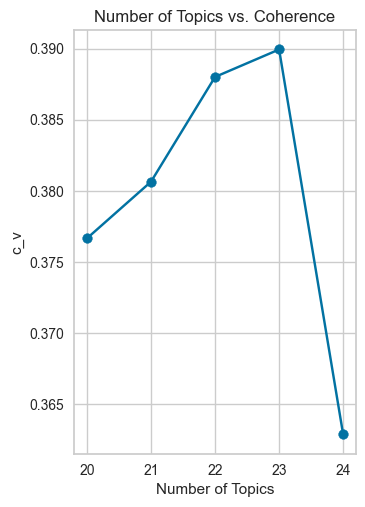

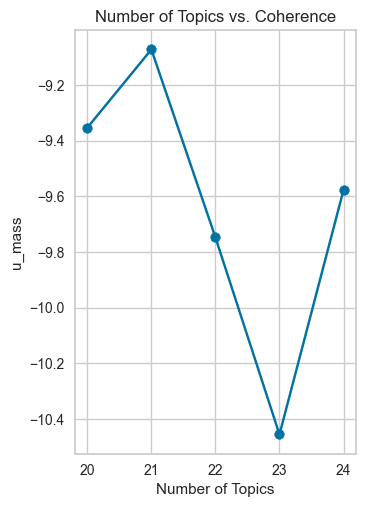

In [122]:
#두개 이어 붙인 거 이_로
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.cleaned_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# 불용어 처리 추가
print(stop_words)

# 3개 짜리 트리그램 [word1, word2, word3] + 두이어붙인 거에
reviews_w_ngrams = reviews_w_ngrams.cleaned_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
umass = []
px = []

for k in range(20,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                iterations=200, chunksize = 10000, eval_every = None, random_state=0)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='c_v')
    mm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='u_mass')
    coherence.append((k,cm.get_coherence()))
    umass.append((k,mm.get_coherence()))
    
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

x_val_u = [x[0] for x in umass]
y_val_y = [x[1] for x in umass]

plt.subplot(1,2,1)
plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('c_v')
plt.xticks(x_val)
plt.show()

plt.subplot(1,2,2)
plt.plot(x_val_u,y_val_y)
plt.scatter(x_val_u,y_val_y)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('u_mass')
plt.xticks(x_val_u)
plt.show()

In [123]:
for i in range(20,25):
    name = 'cs'
    num = i
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    Lda2 = gensim.models.ldamodel.LdaModel
    ldamodel2 = Lda2(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    # To show initial topics
    ldamodel.show_topics(num, num_words=10, formatted=False)

    # To show initial topics
    ldamodel2.show_topics(num, num_words=10, formatted=False)

    # Visualize the topics
    pyLDAvis.enable_notebook()
    LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

    # Create directory if it does not exist
    if not os.path.exists('./results'):
        os.makedirs('./results')

    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
    # load the pre-prepared pyLDAvis data from disk

    with open(LDAvis_data_filepath, 'rb') as f:
        LDAvis_prepared = pickle.load(f)
    pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ f'{name}_{num}' +'.html')
    display(LDAvis_prepared)

    topic_data = LDAvis_prepared
    all_topics = {}
    num_terms = 10  # Adjust number of words to represent each topic
    lambd = 0.6  # Adjust this accordingly based on tuning above

    for j in range(1, num + 1):  # Adjust this to reflect number of topics chosen for final LDA model
        topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic' + str(j)].copy()
        topic['relevance'] = topic['loglift'] * (1 - lambd) + topic['logprob'] * lambd
        
        # 리스트 길이 보정: max_length 만큼 패딩 (NaN 추가)
        terms = topic.sort_values(by='relevance', ascending=False).Term.tolist()
        all_topics['Topic ' + str(j)] = terms[:num_terms] + [None] * (num_terms - len(terms))

    lda2_test_results = pd.DataFrame.from_dict(all_topics, orient='index')
    display(lda2_test_results)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.094019  0.022034       1        1  10.072940
14     0.007297  0.009014       2        1   6.735611
18    -0.073729  0.059765       3        1   6.542937
1     -0.125820  0.000127       4        1   6.285859
12    -0.018668 -0.073544       5        1   5.919437
2     -0.050232 -0.071114       6        1   5.828910
0      0.079507  0.214585       7        1   5.519193
11    -0.062339 -0.050262       8        1   5.121005
3     -0.017726 -0.001773       9        1   5.040586
15    -0.042128  0.096901      10        1   4.794271
7      0.007873 -0.007292      11        1   4.734418
9      0.056522 -0.002295      12        1   4.700664
8     -0.030676  0.000165      13        1   4.511594
10    -0.044084 -0.025510      14        1   4.275940
19     0.044618 -0.056313      15        1   4.207902
6      0.049707 -0.010321      16        1   4.010916
5     -0.002401  0.005973      17        1   3.658102
13     0.091275  0.008561      18        1   3.466471
16     0.112974 -0.036697      19        1   2.748525
17     0.112051 -0.082003      20        1   1.824720, topic_info=                 Term        Freq       Total Category  logprob  loglift
10             bottle  106.000000  106.000000  Default  30.0000  30.0000
727           patches   35.000000   35.000000  Default  29.0000  29.0000
44                bad   60.000000   60.000000  Default  28.0000  28.0000
75              smell   70.000000   70.000000  Default  27.0000  27.0000
127             empty   22.000000   22.000000  Default  26.0000  26.0000
253             since   34.000000   34.000000  Default  25.0000  25.0000
3                face  187.000000  187.000000  Default  24.0000  24.0000
309            sticky   34.000000   34.000000  Default  23.0000  23.0000
41              pores   28.000000   28.000000  Default  22.0000  22.0000
120              half   28.000000   28.000000  Default  21.0000  21.0000
68         difference   35.000000   35.000000  Default  20.0000  20.0000
115               red   40.000000   40.000000  Default  19.0000  19.0000
109            smells   41.000000   41.000000  Default  18.0000  18.0000
60             wanted   32.000000   32.000000  Default  17.0000  17.0000
54            texture   29.000000   29.000000  Default  16.0000  16.0000
1           sensitive   61.000000   61.000000  Default  15.0000  15.0000
0                oily   36.000000   36.000000  Default  14.0000  14.0000
1012            serum   43.000000   43.000000  Default  13.0000  13.0000
2331          dropper   12.000000   12.000000  Default  12.0000  12.0000
239             feels   39.000000   39.000000  Default  11.0000  11.0000
370            greasy   16.000000   16.000000  Default  10.0000  10.0000
338           results   23.000000   23.000000  Default   9.0000   9.0000
288      moisturizing   18.000000   18.000000  Default   8.0000   8.0000
4                good   78.000000   78.000000  Default   7.0000   7.0000
191               oil   34.000000   34.000000  Default   6.0000   6.0000
420         sunscreen   19.000000   19.000000  Default   5.0000   5.0000
117           arrived   17.000000   17.000000  Default   4.0000   4.0000
57              toner   25.000000   25.000000  Default   3.0000   3.0000
34          recommend   50.000000   50.000000  Default   2.0000   2.0000
312          allergic   20.000000   20.000000  Default   1.0000   1.0000
1585            deals    3.479411    4.205415   Topic1  -5.6367   2.1058
1586          dormant    3.479411    4.205415   Topic1  -5.6367   2.1058
1587          flaring    3.479411    4.205415   Topic1  -5.6367   2.1058
1589          lotions    3.479411    4.205415   Topic1  -5.6367   2.1058
1592            olive    3.479411    4.205415   Topic1  -5.6367   2.1058
1593       reapplying    3.479411    4.205415   Topic1  -5.6367   2.1058
1597        wisconsin    3.479411    4.205415   Topic1  -5.6367   2.

,0,1,2,3,4,5,6,7,8,9
Topic 1,day,good,face,dry,red,wrong,reviews,burning,stopped,dried
Topic 2,reviews,liquid,sensitive,effect,redness,holes,shellfish,irritation,snail_mucin,soap
Topic 3,feels,face,times,okay,results,serum,moisturizer,spray,since,effects
Topic 4,smell,texture,smells,price,purchased,recommend,horrible,seemed,ampule,great
Topic 5,patches,bumps,recommend,sensitive,applied,white,different,shape,cleansing_balm,options
Topic 6,patches,results,scent,face,different,wanted,moisturize,eye,real,sad
Topic 7,bottle,empty,half,dropper,oily,literally,dry,dried,bottom,tip
Topic 8,sticky,unpleasant,smell,throw,face,good,foot,dog,smells,pimples
Topic 9,change,softer,acne,run,hyaluronic_acid,disappointed,acid,night,small,waking
Topic 10,batch,greasy,toner,bad,hard,expected,texture,eye,fast,pumps


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
4     -0.070839  0.146681       1        1  9.612650
18    -0.015872  0.063294       2        1  7.669933
2      0.009426  0.039824       3        1  7.042751
14    -0.037428 -0.002034       4        1  6.239217
1      0.098961  0.066000       5        1  5.581639
6      0.114370  0.014869       6        1  5.455467
15     0.041449  0.053854       7        1  5.328902
8     -0.006359  0.042136       8        1  5.310504
0      0.144827 -0.081342       9        1  5.021341
12     0.057970 -0.005954      10        1  4.731093
7      0.041139  0.015665      11        1  4.687971
3     -0.053254  0.041879      12        1  4.509370
20     0.048426 -0.111922      13        1  4.506774
11     0.026820  0.041804      14        1  4.447454
5     -0.055906  0.020473      15        1  3.642570
16    -0.098982 -0.017909      16        1  3.528199
9     -0.074610 -0.047441      17        1  3.381239
19    -0.059168 -0.040192      18        1  2.775683
17    -0.080573 -0.124501      19        1  2.629322
10    -0.053660 -0.063181      20        1  2.161524
13     0.023263 -0.052002      21        1  1.736397, topic_info=                 Term        Freq       Total Category  logprob  loglift
10             bottle  106.000000  106.000000  Default  30.0000  30.0000
44                bad   60.000000   60.000000  Default  29.0000  29.0000
75              smell   69.000000   69.000000  Default  28.0000  28.0000
109            smells   41.000000   41.000000  Default  27.0000  27.0000
127             empty   22.000000   22.000000  Default  26.0000  26.0000
446             itchy   22.000000   22.000000  Default  25.0000  25.0000
3                face  186.000000  186.000000  Default  24.0000  24.0000
238               dry   75.000000   75.000000  Default  23.0000  23.0000
727           patches   35.000000   35.000000  Default  22.0000  22.0000
120              half   28.000000   28.000000  Default  21.0000  21.0000
312          allergic   20.000000   20.000000  Default  20.0000  20.0000
41              pores   27.000000   27.000000  Default  19.0000  19.0000
4                good   77.000000   77.000000  Default  18.0000  18.0000
115               red   41.000000   41.000000  Default  17.0000  17.0000
2331          dropper   12.000000   12.000000  Default  16.0000  16.0000
239             feels   40.000000   40.000000  Default  15.0000  15.0000
370            greasy   17.000000   17.000000  Default  14.0000  14.0000
1501              eye   22.000000   22.000000  Default  13.0000  13.0000
260              tube   16.000000   16.000000  Default  12.0000  12.0000
0                oily   36.000000   36.000000  Default  11.0000  11.0000
203           pimples   18.000000   18.000000  Default  10.0000  10.0000
43               acne   69.000000   69.000000  Default   9.0000   9.0000
103               day   41.000000   41.000000  Default   8.0000   8.0000
633              eyes   17.000000   17.000000  Default   7.0000   7.0000
396             cream   41.000000   41.000000  Default   6.0000   6.0000
148         breakouts   16.000000   16.000000  Default   5.0000   5.0000
205         something   40.000000   40.000000  Default   4.0000   4.0000
5                help   25.000000   25.000000  Default   3.0000   3.0000
25          packaging   21.000000   21.000000  Default   2.0000   2.0000
309            sticky   34.000000   34.000000  Default   1.0000   1.0000
1594       recovering    4.311628    5.035027   Topic1  -5.3754   2.1870
1585            deals    3.457409    4.180809   Topic1  -5.5962   2.1521
1586          dormant    3.457409    4.180809   Topic1  -5.5962   2.1521
1587          flaring    3.457409    4.180809   Topic1  -5.5962   2.1521
1589          lotions    3.457409    4.180809   Topic1  -5.5962   2.1521
1597        wisconsin    3.457409    4.180809   Topic1  -5.5962   2.1521
1592            olive    3.457409    

,0,1,2,3,4,5,6,7,8,9
Topic 1,day,face,good,dry,spots,wrong,oil,red,recovering,coconut
Topic 2,face,serum,feels,drops,moisturizing,spray,old,move,blotchy,headache
Topic 3,patches,results,face,bottle,difference,different,large,repurchase,acne,eye
Topic 4,sensitive,holes,shellfish,outbreak,stripping,liquid,red,face,spilled,leaves
Topic 5,smells,smell,long,toner,something,texture,fish,horrible,old,dog
Topic 6,bht,vit,mascara,toxic,something,sunscreen,package,past,lips,seemed
Topic 7,laneige,past,blemishes,toss,water,ones,bottles,effect,oily,literally
Topic 8,itchy,rash,chin,wanted,since,face,figure,bad,dry,acne
Topic 9,bottle,empty,dropper,half,sizes,water,bottom,tip,bottles,hand
Topic 10,syringe,cream,breaks,bed,change,damaged,different,hopefully,fill,bottle


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
4     -0.080107  0.096984       1        1  8.784061
18    -0.007260 -0.013673       2        1  7.125793
2     -0.082620 -0.024868       3        1  7.006960
0      0.180341 -0.000529       4        1  6.044718
7     -0.005010 -0.089184       5        1  5.641870
3     -0.063781 -0.081765       6        1  5.637611
11    -0.015915 -0.054351       7        1  5.446382
12     0.018276 -0.038148       8        1  5.224246
14    -0.045054  0.019088       9        1  4.773521
8     -0.074532 -0.011487      10        1  4.667632
1     -0.017475 -0.106321      11        1  4.183901
15     0.009035 -0.047397      12        1  4.096683
5     -0.042518  0.146240      13        1  3.861540
19    -0.076885  0.068734      14        1  3.614218
9     -0.032464  0.048591      15        1  3.610623
16    -0.021993 -0.076778      16        1  3.526221
6      0.114501 -0.044220      17        1  3.380453
20     0.182383  0.072927      18        1  3.370604
21     0.011137  0.020174      19        1  2.831781
17     0.028262  0.016864      20        1  2.673440
13     0.027674  0.044612      21        1  2.571673
10    -0.005994  0.054504      22        1  1.926066, topic_info=                 Term        Freq       Total Category  logprob  loglift
10             bottle  107.000000  107.000000  Default  30.0000  30.0000
3                face  185.000000  185.000000  Default  29.0000  29.0000
1           sensitive   59.000000   59.000000  Default  28.0000  28.0000
44                bad   60.000000   60.000000  Default  27.0000  27.0000
75              smell   70.000000   70.000000  Default  26.0000  26.0000
68         difference   35.000000   35.000000  Default  25.0000  25.0000
370            greasy   16.000000   16.000000  Default  24.0000  24.0000
727           patches   36.000000   36.000000  Default  23.0000  23.0000
309            sticky   35.000000   35.000000  Default  22.0000  22.0000
115               red   41.000000   41.000000  Default  21.0000  21.0000
43               acne   70.000000   70.000000  Default  20.0000  20.0000
127             empty   22.000000   22.000000  Default  19.0000  19.0000
103               day   41.000000   41.000000  Default  18.0000  18.0000
117           arrived   17.000000   17.000000  Default  17.0000  17.0000
60             wanted   31.000000   31.000000  Default  16.0000  16.0000
239             feels   39.000000   39.000000  Default  15.0000  15.0000
120              half   28.000000   28.000000  Default  14.0000  14.0000
396             cream   40.000000   40.000000  Default  13.0000  13.0000
4                good   78.000000   78.000000  Default  12.0000  12.0000
776           damaged   11.000000   11.000000  Default  11.0000  11.0000
238               dry   74.000000   74.000000  Default  10.0000  10.0000
1012            serum   43.000000   43.000000  Default   9.0000   9.0000
5                help   25.000000   25.000000  Default   8.0000   8.0000
191               oil   34.000000   34.000000  Default   7.0000   7.0000
109            smells   41.000000   41.000000  Default   6.0000   6.0000
205         something   39.000000   39.000000  Default   5.0000   5.0000
180             bumps   13.000000   13.000000  Default   4.0000   4.0000
420         sunscreen   20.000000   20.000000  Default   3.0000   3.0000
45       disappointed   43.000000   43.000000  Default   2.0000   2.0000
0                oily   36.000000   36.000000  Default   1.0000   1.0000
1585            deals    3.448484    4.177032   Topic1  -5.5087   2.2406
1586          dormant    3.448484    4.177032   Topic1  -5.5087   2.2406
1587          flaring    3.448484    4.177032   Topic1  -5.5087   2.2406
1589          lotions    3.448484    4.177032   Topic1  -5.5087   2.2406
1592            olive    3.448484    4.177032   Topic1  -5.5087   2.2406
1593       reapplying    3.448484    4.177032   Topic1  -

,0,1,2,3,4,5,6,7,8,9
Topic 1,day,face,red,good,burning,stopped,wrong,stop,sticky,recommend
Topic 2,face,feels,serum,since,headache,moisturizing,whiteheads,smell,fine,sick
Topic 3,patches,eye,face,different,results,circle,experienced,good,spray,wanted
Topic 4,bottle,empty,half,dropper,dark,bottles,wasting,disappointed,lotion,shake
Topic 5,vit,shelf,exfoliate,itchy,notice,filled,oil,rash,tool,sell
Topic 6,acne,bht,breakouts,toxic,run,sunscreen,painful,combination,delivered,oily
Topic 7,bad,smell,scent,face,smells,smelled,chemical,anymore,years,weeks
Topic 8,lips,different,white,breaks,size,absorbed,felt,hopefully,page,heads
Topic 9,change,patches,holes,shellfish,months,issue,since,save,cheating,boo
Topic 10,sensitive,wanted,bad,acne,causes,recommend,application,outbreak,odor,pores


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
22    -0.171814 -0.018231       1        1  8.024243
18    -0.065050  0.034454       2        1  7.974130
4     -0.080954 -0.014508       3        1  7.306913
15    -0.063383 -0.014256       4        1  6.004202
1     -0.051258  0.133120       5        1  5.885064
2     -0.008776  0.044837       6        1  5.376546
14    -0.010614  0.024142       7        1  5.353860
20     0.161280  0.000124       8        1  4.383789
9     -0.025707 -0.085966       9        1  4.357483
8     -0.078815  0.008385      10        1  4.353118
3     -0.029087  0.046333      11        1  4.336878
7      0.048441  0.078936      12        1  3.986712
12    -0.017196 -0.052887      13        1  3.826721
16    -0.023803  0.051957      14        1  3.707422
0      0.084009  0.046603      15        1  3.379555
6      0.151716  0.066619      16        1  3.217592
19    -0.031527 -0.056512      17        1  3.147608
10    -0.018585 -0.078884      18        1  3.008943
11     0.011797  0.090995      19        1  3.008050
21     0.073506 -0.119752      20        1  2.732036
5      0.038149 -0.093422      21        1  2.442532
13     0.067684 -0.054453      22        1  2.349643
17     0.039989 -0.037635      23        1  1.836959, topic_info=                        Term        Freq       Total Category  logprob  \
10                    bottle  103.000000  103.000000  Default  30.0000   
109                   smells   41.000000   41.000000  Default  29.0000   
75                     smell   69.000000   69.000000  Default  28.0000   
41                     pores   27.000000   27.000000  Default  27.0000   
492              moisturizer   39.000000   39.000000  Default  26.0000   
3                       face  189.000000  189.000000  Default  25.0000   
238                      dry   76.000000   76.000000  Default  24.0000   
43                      acne   70.000000   70.000000  Default  23.0000   
727                  patches   35.000000   35.000000  Default  22.0000   
0                       oily   36.000000   36.000000  Default  21.0000   
344                    great   37.000000   37.000000  Default  20.0000   
127                    empty   21.000000   21.000000  Default  19.0000   
396                    cream   40.000000   40.000000  Default  18.0000   
1012                   serum   44.000000   44.000000  Default  17.0000   
34                 recommend   50.000000   50.000000  Default  16.0000   
45              disappointed   43.000000   43.000000  Default  15.0000   
103                      day   41.000000   41.000000  Default  14.0000   
4                       good   78.000000   78.000000  Default  13.0000   
1398                 bottles   17.000000   17.000000  Default  12.0000   
68                difference   34.000000   34.000000  Default  11.0000   
148                breakouts   16.000000   16.000000  Default  10.0000   
44                       bad   60.000000   60.000000  Default   9.0000   
239                    feels   40.000000   40.000000  Default   8.0000   
114                     rash   12.000000   12.000000  Default   7.0000   
191                      oil   34.000000   34.000000  Default   6.0000   
5                       help   25.000000   25.000000  Default   5.0000   
120                     half   27.000000   27.000000  Default   4.0000   
117                  arrived   17.000000   17.000000  Default   3.0000   
264                     past   11.000000   11.000000  Default   2.0000   
446                    itchy   22.000000   22.000000  Default   1.0000   
2122              sunscreens    5.143589    5.871801   Topic1  -5.0184   
1706                    uses    3.441361    4.169536   Topic1  -5.4203   
1589                 lotions    3.441380    4.169563   Topic1  -5.4203   
1585                   deals    3.441380    4.169563   Topic1  -5.4203   
1586                 dormant    3.441380  

,0,1,2,3,4,5,6,7,8,9
Topic 1,face,day,red,greasy,sunscreens,allergic,pimples,reviews,eye,searching
Topic 2,feels,face,dry,clean,exfoliate,results,water,scent,good,serum
Topic 3,face,sticky,good,serum,supposed,washing,moisturizer,masks,wrong,dry
Topic 4,hard,eye,texture,several,states,softer,batch,surprised,based,worst
Topic 5,smells,smell,recommend,acne,sensitive,bad,face,texture,long,something
Topic 6,patches,bottle,acne,blemishes,believe,tanner,wasnt,scent,disappointing,self
Topic 7,irritation,bottle,disappointed,face,dropper,liquid,direct,boo,hydration,expensive
Topic 8,bottle,arrived,betaine,fill,spilled,salicylic_acid,salicylate,syringe,outbreak,photo
Topic 9,dead,terrible,sick,sent,pot,headache,experience,filled,heating,pad
Topic 10,moisturizer,dry,wanted,itchy,beneficial,hydrate,glow,summer,curve,completely


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
4      0.100543 -0.073882       1        1  8.974992
14     0.049263  0.038248       2        1  6.018032
3      0.090892 -0.074656       3        1  5.322337
1      0.049038 -0.096434       4        1  5.178149
2      0.033851 -0.033070       5        1  5.166898
18     0.000016 -0.049773       6        1  5.011044
22     0.087836  0.035724       7        1  4.962725
0      0.005955 -0.078288       8        1  4.792265
12     0.055042  0.032724       9        1  4.623851
20    -0.177224  0.050847      10        1  4.499725
8      0.067707  0.037799      11        1  4.193602
9      0.028828  0.125366      12        1  3.914772
6     -0.135339 -0.077683      13        1  3.645380
23    -0.037379  0.025899      14        1  3.621447
13    -0.108457 -0.025202      15        1  3.620565
11    -0.034959 -0.066792      16        1  3.440560
7      0.003950  0.039091      17        1  3.274072
21     0.021649 -0.016858      18        1  3.242375
5     -0.005828  0.042053      19        1  3.218795
16    -0.089553 -0.001847      20        1  3.184595
19     0.066722  0.082732      21        1  2.878634
15    -0.021977 -0.047706      22        1  2.732592
10    -0.013826  0.021467      23        1  2.297038
17    -0.036750  0.110240      24        1  2.185554, topic_info=                 Term        Freq       Total Category  logprob  loglift
10             bottle  104.000000  104.000000  Default  30.0000  30.0000
75              smell   69.000000   69.000000  Default  29.0000  29.0000
44                bad   61.000000   61.000000  Default  28.0000  28.0000
68         difference   34.000000   34.000000  Default  27.0000  27.0000
0                oily   37.000000   37.000000  Default  26.0000  26.0000
1398          bottles   17.000000   17.000000  Default  25.0000  25.0000
1012            serum   43.000000   43.000000  Default  24.0000  24.0000
1           sensitive   61.000000   61.000000  Default  23.0000  23.0000
727           patches   36.000000   36.000000  Default  22.0000  22.0000
127             empty   21.000000   21.000000  Default  21.0000  21.0000
396             cream   40.000000   40.000000  Default  20.0000  20.0000
288      moisturizing   18.000000   18.000000  Default  19.0000  19.0000
115               red   42.000000   42.000000  Default  18.0000  18.0000
109            smells   41.000000   41.000000  Default  17.0000  17.0000
103               day   41.000000   41.000000  Default  16.0000  16.0000
344             great   37.000000   37.000000  Default  15.0000  15.0000
43               acne   71.000000   71.000000  Default  14.0000  14.0000
238               dry   74.000000   74.000000  Default  13.0000  13.0000
3                face  186.000000  186.000000  Default  12.0000  12.0000
253             since   34.000000   34.000000  Default  11.0000  11.0000
54            texture   29.000000   29.000000  Default  10.0000  10.0000
45       disappointed   43.000000   43.000000  Default   9.0000   9.0000
117           arrived   18.000000   18.000000  Default   8.0000   8.0000
34          recommend   50.000000   50.000000  Default   7.0000   7.0000
362              pump   13.000000   13.000000  Default   6.0000   6.0000
84              water   19.000000   19.000000  Default   5.0000   5.0000
420         sunscreen   20.000000   20.000000  Default   4.0000   4.0000
312          allergic   20.000000   20.000000  Default   3.0000   3.0000
239             feels   39.000000   39.000000  Default   2.0000   2.0000
309            sticky   34.000000   34.000000  Default   1.0000   1.0000
1594       recovering    4.398249    5.132357   Topic1  -5.2869   2.2564
1586          dormant    3.525840    4.259948   Topic1  -5.5080   2.2216
1585            deals    3.525840    4.259948   Topic1  -5.5080   2.2216
1593       reapplying    3.525840    4.259948   Topic1  -5.5080   2.2216
1592            olive   

,0,1,2,3,4,5,6,7,8,9
Topic 1,red,face,day,spots,oil,cleanser,recovering,stopped,needed,recommend
Topic 2,patches,acne,sensitive,good,small,eye,effect,peeling,shellfish,ampule
Topic 3,oily,breakouts,change,greasy,sunscreen,lightweight,moisturizer,combination,acne,night
Topic 4,texture,smell,smells,felt,price,mold,fish,hopefully,fast,toner
Topic 5,results,face,scent,spray,decent,experience,properly,hands,normal,wanted
Topic 6,face,pores,serum,clean,feels,terrible,fragrance,wrong,clogged,good
Topic 7,face,itchy,sensitive,bad,rash,seal,uses,pimples,dog,foot
Topic 8,dry,tight,removing,bottle,oily,hope,normal,good,understand,shook
Topic 9,lips,burned,outbreak,stopped,ones,page,everyone,breaks,eyes,you’re
Topic 10,arrived,bottle,betaine,salicylic_acid,syringe,salicylate,leaking,acid,fill,claims


In [124]:
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_dr.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_cs.cleaned_review.copy())
reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_bj.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_if.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_pu.cleaned_review.copy())

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

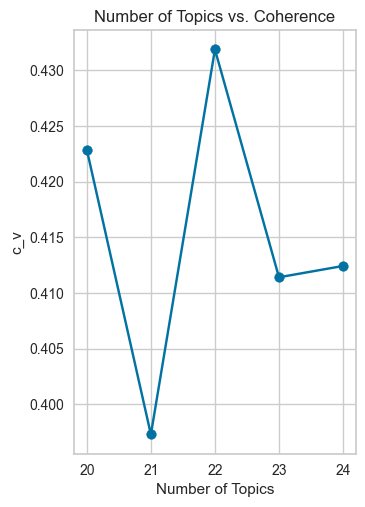

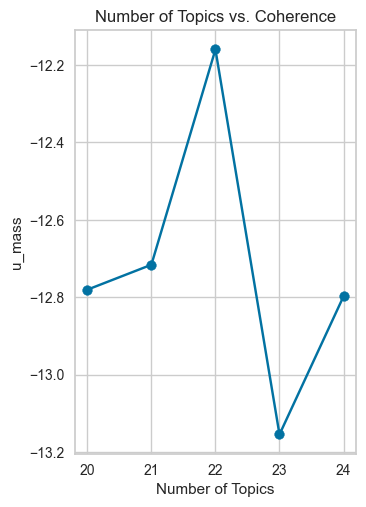

In [125]:
#두개 이어 붙인 거 이_로
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.cleaned_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# 불용어 처리 추가
print(stop_words)

# 3개 짜리 트리그램 [word1, word2, word3] + 두이어붙인 거에
reviews_w_ngrams = reviews_w_ngrams.cleaned_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
umass = []
px = []

for k in range(20,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                iterations=200, chunksize = 10000, eval_every = None, random_state=0)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='c_v')
    mm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='u_mass')
    coherence.append((k,cm.get_coherence()))
    umass.append((k,mm.get_coherence()))
    
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

x_val_u = [x[0] for x in umass]
y_val_y = [x[1] for x in umass]

plt.subplot(1,2,1)
plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('c_v')
plt.xticks(x_val)
plt.show()

plt.subplot(1,2,2)
plt.plot(x_val_u,y_val_y)
plt.scatter(x_val_u,y_val_y)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('u_mass')
plt.xticks(x_val_u)
plt.show()

In [126]:
for i in range(20,25):
    name = 'bj'
    num = i
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    Lda2 = gensim.models.ldamodel.LdaModel
    ldamodel2 = Lda2(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    # To show initial topics
    ldamodel.show_topics(num, num_words=10, formatted=False)

    # To show initial topics
    ldamodel2.show_topics(num, num_words=10, formatted=False)

    # Visualize the topics
    pyLDAvis.enable_notebook()
    LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

    # Create directory if it does not exist
    if not os.path.exists('./results'):
        os.makedirs('./results')

    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
    # load the pre-prepared pyLDAvis data from disk

    with open(LDAvis_data_filepath, 'rb') as f:
        LDAvis_prepared = pickle.load(f)
    pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ f'{name}_{num}' +'.html')
    display(LDAvis_prepared)

    topic_data = LDAvis_prepared
    all_topics = {}
    num_terms = 10  # Adjust number of words to represent each topic
    lambd = 0.6  # Adjust this accordingly based on tuning above

    for j in range(1, num + 1):  # Adjust this to reflect number of topics chosen for final LDA model
        topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic' + str(j)].copy()
        topic['relevance'] = topic['loglift'] * (1 - lambd) + topic['logprob'] * lambd
        
        # 리스트 길이 보정: max_length 만큼 패딩 (NaN 추가)
        terms = topic.sort_values(by='relevance', ascending=False).Term.tolist()
        all_topics['Topic ' + str(j)] = terms[:num_terms] + [None] * (num_terms - len(terms))

    lda2_test_results = pd.DataFrame.from_dict(all_topics, orient='index')
    display(lda2_test_results)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
11     0.001444  0.080893       1        1  8.425928
8     -0.174824 -0.054152       2        1  8.013766
5     -0.057298  0.007865       3        1  6.122660
9     -0.119211  0.017526       4        1  5.973464
18     0.078190 -0.085245       5        1  5.858643
14     0.041977  0.004903       6        1  5.674481
7      0.065730  0.056494       7        1  5.623998
2     -0.087418  0.145468       8        1  5.570971
10    -0.026091 -0.173326       9        1  5.503916
0      0.005902 -0.037075      10        1  5.436384
13     0.062256 -0.029722      11        1  4.979248
6      0.027163  0.027626      12        1  4.673274
19     0.063611  0.026743      13        1  4.446991
16     0.129537  0.025311      14        1  4.352617
1     -0.020933 -0.063891      15        1  4.111740
4      0.009027 -0.017773      16        1  3.845209
3     -0.000050 -0.006708      17        1  3.750315
12     0.000348  0.050503      18        1  3.032963
15     0.014358 -0.022181      19        1  2.764319
17    -0.013716  0.046739      20        1  1.839113, topic_info=                    Term       Freq      Total Category  logprob  loglift
524            sunscreen  15.000000  15.000000  Default  30.0000  30.0000
223                smell  18.000000  18.000000  Default  29.0000  29.0000
4                   face  64.000000  64.000000  Default  28.0000  28.0000
411                 eyes  21.000000  21.000000  Default  27.0000  27.0000
179                  bad  19.000000  19.000000  Default  26.0000  26.0000
956                  oil  15.000000  15.000000  Default  25.0000  25.0000
35                wanted  12.000000  12.000000  Default  24.0000  24.0000
48          disappointed   8.000000   8.000000  Default  23.0000  23.0000
184               bottle  12.000000  12.000000  Default  22.0000  22.0000
455             happened   5.000000   5.000000  Default  21.0000  21.0000
30                  oily  13.000000  13.000000  Default  20.0000  20.0000
219            different  15.000000  15.000000  Default  19.0000  19.0000
65                  good  21.000000  21.000000  Default  18.0000  18.0000
236               burned   6.000000   6.000000  Default  17.0000  17.0000
205                cream  13.000000  13.000000  Default  16.0000  16.0000
120              arrived   6.000000   6.000000  Default  15.0000  15.0000
389                empty   7.000000   7.000000  Default  14.0000  14.0000
368               enough   4.000000   4.000000  Default  13.0000  13.0000
593                  eye  11.000000  11.000000  Default  12.0000  12.0000
560             cleanser   8.000000   8.000000  Default  11.0000  11.0000
126             allergic  15.000000  15.000000  Default  10.0000  10.0000
541              changed   7.000000   7.000000  Default   9.0000   9.0000
597                weeks   7.000000   7.000000  Default   8.0000   8.0000
118                 felt  12.000000  12.000000  Default   7.0000   7.0000
796               rashes   5.000000   5.000000  Default   6.0000   6.0000
148              reviews  10.000000  10.000000  Default   5.0000   5.0000
122          description   7.000000   7.000000  Default   4.0000   4.0000
166            sensitive  27.000000  27.000000  Default   3.0000   3.0000
163             horrible   8.000000   8.000000  Default   2.0000   2.0000
519                  day   8.000000   8.000000  Default   1.0000   1.0000
309           aggressive   1.621551   2.275983   Topic1  -5.0455   2.1348
464                353oz   1.621551   2.275982   Topic1  -5.0455   2.1348
15             structure   1.621550   2.275982   Topic1  -5.0455   2.1348
1040               ideal   1.621546   2.275979   Topic1  -5.0455   2.1348
1042          originally   1.621545   2.275979   Topic1  -5.0455   2.1348
1039             extreme   1.621545   2.275979   Topic1  -5.0455   2.1348
1038            entirety   1.621545   2.275979   Topi

,0,1,2,3,4,5,6,7,8,9
Topic 1,different,night,neck,day,face,routine,good,353oz,aggressive,lid
Topic 2,effect,days,reactions,coconut,pump,affect,niacin,usage,cleansing_balm,dishonest
Topic 3,cream,scent,perfume,glass,difference,sensitive,regular,breakouts,smell,read
Topic 4,horrible,oil,huge,itchy,old,covered,pictures,trash,raw,face
Topic 5,bad,oily,small,afraid,weeks,truth,whiteheads,combination,sent,hydrating
Topic 6,dirty,yesterday,tube,glad,prime,changed,red,receive,turned,burning
Topic 7,retinol,legs,please,toxic,eyes,times,ended,texture,wash,face
Topic 8,empty,bottle,leak,changed,peach,send,thank,recommend,four,wasnt
Topic 9,disappointed,rashes,reviews,felt,allergic,negative,everyday,googlereddit,america,life
Topic 10,burned,damaged,face,replace,cystic,agreed,vomit,request,bad,applied


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
11    -0.037630 -0.091494       1        1  7.058469
5     -0.026866  0.020517       2        1  7.019564
15     0.091573 -0.032025       3        1  6.626451
7      0.034362  0.084873       4        1  6.549385
1     -0.037398 -0.157222       5        1  6.352764
18     0.148477  0.000748       6        1  6.124887
14    -0.106560 -0.001369       7        1  6.116965
6      0.078812 -0.058613       8        1  5.914111
2     -0.100464  0.088295       9        1  5.712867
9      0.035739 -0.041357      10        1  5.431531
10     0.093052 -0.022587      11        1  5.137333
0      0.091630  0.090863      12        1  4.518079
17    -0.018425 -0.083469      13        1  4.404678
8     -0.073796 -0.044844      14        1  4.028442
16    -0.007605  0.034188      15        1  3.776377
13     0.017254  0.089962      16        1  3.347826
12    -0.029323  0.044437      17        1  3.267323
19     0.044524  0.000965      18        1  3.094606
20    -0.077892  0.002721      19        1  2.210880
3     -0.048115  0.019142      20        1  1.755726
4     -0.071350  0.056269      21        1  1.551738, topic_info=                    Term       Freq      Total Category  logprob  loglift
52              original   7.000000   7.000000  Default  30.0000  30.0000
524            sunscreen  16.000000  16.000000  Default  29.0000  29.0000
223                smell  18.000000  18.000000  Default  28.0000  28.0000
25                   dry  20.000000  20.000000  Default  27.0000  27.0000
219            different  15.000000  15.000000  Default  26.0000  26.0000
411                 eyes  22.000000  22.000000  Default  25.0000  25.0000
956                  oil  15.000000  15.000000  Default  24.0000  24.0000
179                  bad  19.000000  19.000000  Default  23.0000  23.0000
148              reviews   9.000000   9.000000  Default  22.0000  22.0000
118                 felt  13.000000  13.000000  Default  21.0000  21.0000
236               burned   6.000000   6.000000  Default  20.0000  20.0000
190           difference   6.000000   6.000000  Default  19.0000  19.0000
44                   red  20.000000  20.000000  Default  18.0000  18.0000
30                  oily  13.000000  13.000000  Default  17.0000  17.0000
593                  eye  11.000000  11.000000  Default  16.0000  16.0000
184               bottle  12.000000  12.000000  Default  15.0000  15.0000
1                  serum  10.000000  10.000000  Default  14.0000  14.0000
126             allergic  14.000000  14.000000  Default  13.0000  13.0000
65                  good  21.000000  21.000000  Default  12.0000  12.0000
441              texture   9.000000   9.000000  Default  11.0000  11.0000
120              arrived   6.000000   6.000000  Default  10.0000  10.0000
35                wanted  13.000000  13.000000  Default   9.0000   9.0000
414                 size   5.000000   5.000000  Default   8.0000   8.0000
451                itchy   5.000000   5.000000  Default   7.0000   7.0000
4                   face  65.000000  65.000000  Default   6.0000   6.0000
122          description   6.000000   6.000000  Default   5.0000   5.0000
205                cream  13.000000  13.000000  Default   4.0000   4.0000
1161                 fda   4.000000   4.000000  Default   3.0000   3.0000
163             horrible   8.000000   8.000000  Default   2.0000   2.0000
165                pores   6.000000   6.000000  Default   1.0000   1.0000
1043               ships   2.341372   2.990823   Topic1  -4.5010   2.4061
968                 pump   3.877924   5.279442   Topic1  -3.9965   2.3424
1160              europe   1.573103   2.222546   Topic1  -4.8987   2.3053
1038            entirety   1.573094   2.222545   Topic1  -4.8987   2.3053
1039             extreme   1.573094   2.222545   Topic1  -4.8987   2.3053
1040               ideal   1.573094   2.222545   Topic1  -4.8987   2.3053


,0,1,2,3,4,5,6,7,8,9
Topic 1,different,pump,ships,felt,times,horrible,europe,entirety,extreme,ideal
Topic 2,scent,perfume,toxic,marketed,wrinkles,concentration,sensitive,face,smell,read
Topic 3,face,toner,contacted,consecutive,agreed,vomit,nose,chin,help,told
Topic 4,instructions,retinol,allergy,coconut,request,afraid,dishonest,replace,retinal,serious
Topic 5,dry,find,combination,red,wasted,glad,ago,oily,today,sunscreen
Topic 6,eye,disappointed,small,niacin,affect,properties,allergic,whiteheads,forehead,reactions
Topic 7,dirty,cream,water,cystic,fantastic,peach,prime,tube,353oz,dermatologist
Topic 8,eyes,irritated,sensitive,everyday,pleasant,deeper,you’re,cleanser,soap,good
Topic 9,changed,leak,weird,empty,wasnt,bottle,serums,oil,send,four
Topic 10,itchy,rashes,reviews,positive,allergic,huge,raw,america,suppose,googlereddit


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
21     0.136589 -0.049461       1        1  6.900174
12     0.026005  0.119171       2        1  6.093353
6     -0.038974 -0.067110       3        1  5.767512
13     0.103987 -0.085198       4        1  5.629638
8     -0.224320 -0.021406       5        1  5.543725
14    -0.001795 -0.083105       6        1  5.437099
2     -0.019742  0.026446       7        1  5.116593
16    -0.062501 -0.008679       8        1  5.054025
5      0.033120  0.045977       9        1  4.989176
10     0.041350  0.099266      10        1  4.878550
15    -0.017139 -0.080517      11        1  4.875271
19     0.063111  0.031683      12        1  4.790414
7      0.058856 -0.071666      13        1  4.205962
9      0.028523 -0.055015      14        1  4.146428
0      0.043709  0.096911      15        1  4.081916
18     0.049229 -0.015849      16        1  4.063189
4     -0.049778  0.019793      17        1  3.873595
3     -0.017978  0.117904      18        1  3.340414
11    -0.042085 -0.060858      19        1  3.169912
1     -0.025759  0.037956      20        1  3.132007
17    -0.049629  0.006333      21        1  2.985578
20    -0.034782 -0.002579      22        1  1.925472, topic_info=                    Term       Freq      Total Category  logprob  loglift
219            different  14.000000  14.000000  Default  30.0000  30.0000
223                smell  18.000000  18.000000  Default  29.0000  29.0000
411                 eyes  22.000000  22.000000  Default  28.0000  28.0000
4                   face  64.000000  64.000000  Default  27.0000  27.0000
389                empty   7.000000   7.000000  Default  26.0000  26.0000
184               bottle  12.000000  12.000000  Default  25.0000  25.0000
956                  oil  14.000000  14.000000  Default  24.0000  24.0000
30                  oily  13.000000  13.000000  Default  23.0000  23.0000
65                  good  21.000000  21.000000  Default  22.0000  22.0000
25                   dry  19.000000  19.000000  Default  21.0000  21.0000
179                  bad  18.000000  18.000000  Default  20.0000  20.0000
236               burned   6.000000   6.000000  Default  19.0000  19.0000
163             horrible   8.000000   8.000000  Default  18.0000  18.0000
129            recommend  18.000000  18.000000  Default  17.0000  17.0000
205                cream  13.000000  13.000000  Default  16.0000  16.0000
52              original   8.000000   8.000000  Default  15.0000  15.0000
524            sunscreen  17.000000  17.000000  Default  14.0000  14.0000
48          disappointed   8.000000   8.000000  Default  13.0000  13.0000
593                  eye  11.000000  11.000000  Default  12.0000  12.0000
206                 days  13.000000  13.000000  Default  11.0000  11.0000
854                scent   5.000000   5.000000  Default  10.0000  10.0000
126             allergic  14.000000  14.000000  Default   9.0000   9.0000
122          description   7.000000   7.000000  Default   8.0000   8.0000
120              arrived   6.000000   6.000000  Default   7.0000   7.0000
165                pores   7.000000   7.000000  Default   6.0000   6.0000
74                smells   7.000000   7.000000  Default   5.0000   5.0000
541              changed   7.000000   7.000000  Default   4.0000   4.0000
968                 pump   5.000000   5.000000  Default   3.0000   3.0000
560             cleanser   8.000000   8.000000  Default   2.0000   2.0000
35                wanted  13.000000  13.000000  Default   1.0000   1.0000
1114            addition   1.569222   2.233173   Topic1  -4.8785   2.3208
96            personally   2.336406   3.754156   Topic1  -4.4805   2.1994
873              healing   0.802022   1.465973   Topic1  -5.5497   2.0705
874                light   0.802022   1.465973   Topic1  -5.5497   2.0705
875            neosporin   0.802022   1.465973   Topic1  -5.5497   2.0705
876               reg

,0,1,2,3,4,5,6,7,8,9
Topic 1,face,recommend,personally,times,leaves,masks,dry,addition,difference,although
Topic 2,description,eye,face,353oz,pictures,afraid,structure,together,serum,spot
Topic 3,good,deeper,american,longer,filters,thicker,spf,company,greasy,long
Topic 4,eyes,worst,cream,replacement,face,replace,rubbing,dose,request,nose
Topic 5,affect,seconds,europe,authenticity,scan,niacin,different,compared,reactions,taking
Topic 6,sunscreen,smell,three,burns,water,cystic,glad,days,cream,regular
Topic 7,changed,oil,old,peach,serums,cleanser,four,several,cleansing_oil,routine
Topic 8,instructions,coconut,toner,happened,serious,remember,retinal,dishonest,eyes,exfoliating
Topic 9,smells,experience,unpleasant,pleasant,marketed,toxic,you’re,sensitive,cleanser,feeling
Topic 10,disappointed,rashes,reviews,america,life,negative,suppose,googlereddit,felt,allergic


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
7     -0.083878 -0.036522       1        1  7.096254
21    -0.057452 -0.064466       2        1  7.045925
9     -0.058328 -0.066527       3        1  6.760787
16    -0.141516  0.037140       4        1  6.561252
18    -0.010268  0.021585       5        1  6.276315
19     0.013742 -0.038674       6        1  6.203502
5      0.006382 -0.090925       7        1  5.921413
2     -0.010753 -0.082962       8        1  4.573644
11    -0.105970 -0.002241       9        1  4.459130
8      0.042021 -0.053614      10        1  4.448536
6      0.012548 -0.067858      11        1  4.028373
15    -0.073758  0.047600      12        1  3.920234
13    -0.038439  0.086870      13        1  3.730525
14    -0.058751  0.105926      14        1  3.663814
0      0.111662  0.008396      15        1  3.588801
22    -0.003671 -0.032038      16        1  3.455579
20     0.068947 -0.058539      17        1  3.453151
3      0.066281  0.157032      18        1  3.334267
10     0.110885 -0.035497      19        1  2.951516
12     0.036947  0.011646      20        1  2.720959
17     0.036913  0.076924      21        1  1.956832
1      0.033013  0.052671      22        1  1.947444
4      0.103444  0.024073      23        1  1.901748, topic_info=                     Term       Freq      Total Category  logprob  loglift
223                 smell  17.000000  17.000000  Default  30.0000  30.0000
219             different  14.000000  14.000000  Default  29.0000  29.0000
4                    face  65.000000  65.000000  Default  28.0000  28.0000
956                   oil  14.000000  14.000000  Default  27.0000  27.0000
30                   oily  12.000000  12.000000  Default  26.0000  26.0000
524             sunscreen  16.000000  16.000000  Default  25.0000  25.0000
120               arrived   5.000000   5.000000  Default  24.0000  24.0000
122           description   6.000000   6.000000  Default  23.0000  23.0000
389                 empty   7.000000   7.000000  Default  22.0000  22.0000
411                  eyes  22.000000  22.000000  Default  21.0000  21.0000
184                bottle  12.000000  12.000000  Default  20.0000  20.0000
118                  felt  12.000000  12.000000  Default  19.0000  19.0000
179                   bad  19.000000  19.000000  Default  18.0000  18.0000
236                burned   6.000000   6.000000  Default  17.0000  17.0000
205                 cream  12.000000  12.000000  Default  16.0000  16.0000
48           disappointed   8.000000   8.000000  Default  15.0000  15.0000
44                    red  20.000000  20.000000  Default  14.0000  14.0000
166             sensitive  27.000000  27.000000  Default  13.0000  13.0000
129             recommend  19.000000  19.000000  Default  12.0000  12.0000
593                   eye  11.000000  11.000000  Default  11.0000  11.0000
52               original   8.000000   8.000000  Default  10.0000  10.0000
560              cleanser   8.000000   8.000000  Default   9.0000   9.0000
35                 wanted  13.000000  13.000000  Default   8.0000   8.0000
385             breakouts   5.000000   5.000000  Default   7.0000   7.0000
126              allergic  15.000000  15.000000  Default   6.0000   6.0000
40                package   6.000000   6.000000  Default   5.0000   5.0000
65                   good  21.000000  21.000000  Default   4.0000   4.0000
455              happened   5.000000   5.000000  Default   3.0000   3.0000
99                 sticky   8.000000   8.000000  Default   2.0000   2.0000
225                 times   8.000000   8.000000  Default   1.0000   1.0000
722          instructions   2.403123   3.056873   Topic1  -4.4803   2.4050
724              remember   1.613513   2.267263   Topic1  -4.8787   2.3054
725               retinal   1.613513   2.267263   Topic1  -4.8787   2.3054
15              structure   1.613513   2.267262   Topic1  -4.8787   2.3054
757    

,0,1,2,3,4,5,6,7,8,9
Topic 1,eyes,times,instructions,face,legs,retinol,excited,bad,retinal,structure
Topic 2,seemed,rashes,great,reviews,personally,face,masks,long,googlereddit,america
Topic 3,pores,sunscreen,huge,itchy,oil,pictures,raw,covered,wanted,face
Topic 4,coconut,dishonest,agreed,vomit,aggressive,serious,face,chest,dried,exfoliating
Topic 5,bad,afraid,niacin,affect,peach,takes,units,sent,reactions,forehead
Topic 6,burned,zits,toxic,europe,cystic,compared,original,sunscreens,high,face
Topic 7,smells,sensitive,cleansing_oil,past,glass,truth,stick,texture,worth,routine
Topic 8,cleanser,pleasant,changed,eye_cream,puffy,stop,scent,allergic,difference,empty
Topic 9,red,burning,irritated,watery,missing,consistency,face,neck,felt,returning
Topic 10,pump,crust,lower,good,oily,writing,pretty,taking,find,leaves


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
22    -0.113241  0.081527       1        1  7.176249
23    -0.119669 -0.082160       2        1  6.663637
10    -0.152360 -0.015320       3        1  5.992877
5     -0.017670  0.115221       4        1  5.932725
13    -0.045870  0.046132       5        1  5.710830
21    -0.077807 -0.098069       6        1  5.418654
11    -0.031696  0.086574       7        1  5.242067
0      0.070969 -0.049760       8        1  4.380277
15     0.017120 -0.063202       9        1  4.146204
12    -0.044086 -0.007144      10        1  4.040395
9      0.015678  0.061046      11        1  4.011538
7      0.042410  0.130416      12        1  3.843325
18    -0.039942 -0.068593      13        1  3.769648
14    -0.003039 -0.019881      14        1  3.748618
2      0.177709 -0.025850      15        1  3.681947
16    -0.032217  0.075019      16        1  3.677288
1      0.039732 -0.066028      17        1  3.583429
6      0.077518  0.052816      18        1  3.292735
20     0.026635 -0.036006      19        1  3.074626
3      0.042858 -0.064779      20        1  2.922530
19    -0.038922 -0.046575      21        1  2.790298
17     0.098821 -0.001497      22        1  2.788286
4      0.045571  0.050765      23        1  2.305562
8      0.061499 -0.054651      24        1  1.806258, topic_info=                     Term       Freq      Total Category  logprob  loglift
411                  eyes  21.000000  21.000000  Default  30.0000  30.0000
524             sunscreen  16.000000  16.000000  Default  29.0000  29.0000
30                   oily  13.000000  13.000000  Default  28.0000  28.0000
4                    face  66.000000  66.000000  Default  27.0000  27.0000
219             different  14.000000  14.000000  Default  26.0000  26.0000
956                   oil  14.000000  14.000000  Default  25.0000  25.0000
223                 smell  19.000000  19.000000  Default  24.0000  24.0000
35                 wanted  13.000000  13.000000  Default  23.0000  23.0000
593                   eye  11.000000  11.000000  Default  22.0000  22.0000
126              allergic  15.000000  15.000000  Default  21.0000  21.0000
25                    dry  19.000000  19.000000  Default  20.0000  20.0000
163              horrible   8.000000   8.000000  Default  19.0000  19.0000
65                   good  21.000000  21.000000  Default  18.0000  18.0000
385             breakouts   5.000000   5.000000  Default  17.0000  17.0000
205                 cream  12.000000  12.000000  Default  16.0000  16.0000
118                  felt  13.000000  13.000000  Default  15.0000  15.0000
190            difference   6.000000   6.000000  Default  14.0000  14.0000
122           description   7.000000   7.000000  Default  13.0000  13.0000
166             sensitive  26.000000  26.000000  Default  12.0000  12.0000
206                  days  12.000000  12.000000  Default  11.0000  11.0000
236                burned   6.000000   6.000000  Default  10.0000  10.0000
184                bottle  12.000000  12.000000  Default   9.0000   9.0000
345                   boj   6.000000   6.000000  Default   8.0000   8.0000
560              cleanser   8.000000   8.000000  Default   7.0000   7.0000
48           disappointed   8.000000   8.000000  Default   6.0000   6.0000
389                 empty   7.000000   7.000000  Default   5.0000   5.0000
854                 scent   5.000000   5.000000  Default   4.0000   4.0000
265               pimples   9.000000   9.000000  Default   3.0000   3.0000
148               reviews  10.000000  10.000000  Default   2.0000   2.0000
177             irritated   7.000000   7.000000  Default   1.0000   1.0000
275                affect   1.622282   2.283525   Topic1  -4.8845   2.2925
291                niacin   1.622282   2.283525   Topic1  -4.8845   2.2925
910                   raw   1.622281   2.283524   Topic1  -4.8845   2.2925
1124          formulation   3

,0,1,2,3,4,5,6,7,8,9
Topic 1,smell,sunscreen,face,formulation,company,bad,affect,niacin,raw,american
Topic 2,times,happened,face,felt,wanted,toner,agreed,vomit,days,whiteheads
Topic 3,rashes,allergic,felt,disappointed,reviews,water,looks,face_wash,suppose,america
Topic 4,burned,scent,perfume,fragrance,pleasant,toxic,concentration,you’re,face,cleanser
Topic 5,sent,face,aggressive,hope,chest,gentle,night,neck,worst,routine
Topic 6,oily,leaves,face,masks,afraid,expensive,believe,clear,personally,developed
Topic 7,good,instructions,compared,description,legs,sunscreens,eyes,retinal,remember,europe
Topic 8,boj,packaging,entire,damaged,cystic,current,dissatisfied,wasted,awful,painful
Topic 9,tube,entirety,extreme,ideal,lid,originally,coming,directly,ships,refund
Topic 10,pictures,structure,darker,removing,small,hours,serum,face,thus,true


In [127]:
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_dr.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_cs.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_bj.cleaned_review.copy())
reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_if.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_pu.cleaned_review.copy())


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

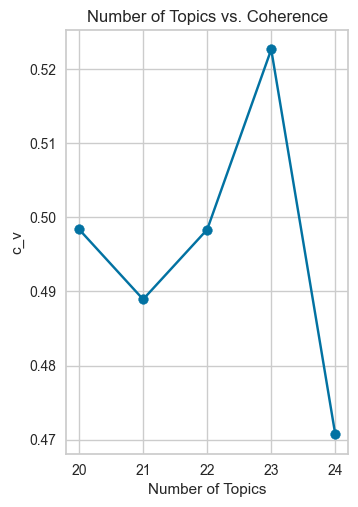

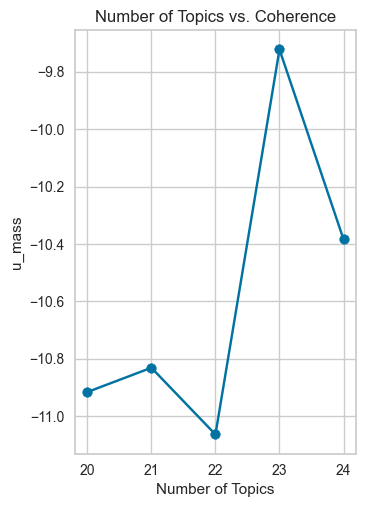

In [128]:
#두개 이어 붙인 거 이_로
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.cleaned_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# 불용어 처리 추가
print(stop_words)

# 3개 짜리 트리그램 [word1, word2, word3] + 두이어붙인 거에
reviews_w_ngrams = reviews_w_ngrams.cleaned_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
umass = []
px = []

for k in range(20,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                iterations=200, chunksize = 10000, eval_every = None, random_state=0)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='c_v')
    mm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='u_mass')
    coherence.append((k,cm.get_coherence()))
    umass.append((k,mm.get_coherence()))
    
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

x_val_u = [x[0] for x in umass]
y_val_y = [x[1] for x in umass]

plt.subplot(1,2,1)
plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('c_v')
plt.xticks(x_val)
plt.show()

plt.subplot(1,2,2)
plt.plot(x_val_u,y_val_y)
plt.scatter(x_val_u,y_val_y)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('u_mass')
plt.xticks(x_val_u)
plt.show()

In [129]:
for i in range(20,25):
    name = 'if'
    num = i
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    Lda2 = gensim.models.ldamodel.LdaModel
    ldamodel2 = Lda2(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    # To show initial topics
    ldamodel.show_topics(num, num_words=10, formatted=False)

    # To show initial topics
    ldamodel2.show_topics(num, num_words=10, formatted=False)

    # Visualize the topics
    pyLDAvis.enable_notebook()
    LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

    # Create directory if it does not exist
    if not os.path.exists('./results'):
        os.makedirs('./results')

    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
    # load the pre-prepared pyLDAvis data from disk

    with open(LDAvis_data_filepath, 'rb') as f:
        LDAvis_prepared = pickle.load(f)
    pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ f'{name}_{num}' +'.html')
    display(LDAvis_prepared)

    topic_data = LDAvis_prepared
    all_topics = {}
    num_terms = 10  # Adjust number of words to represent each topic
    lambd = 0.6  # Adjust this accordingly based on tuning above

    for j in range(1, num + 1):  # Adjust this to reflect number of topics chosen for final LDA model
        topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic' + str(j)].copy()
        topic['relevance'] = topic['loglift'] * (1 - lambd) + topic['logprob'] * lambd
        
        # 리스트 길이 보정: max_length 만큼 패딩 (NaN 추가)
        terms = topic.sort_values(by='relevance', ascending=False).Term.tolist()
        all_topics['Topic ' + str(j)] = terms[:num_terms] + [None] * (num_terms - len(terms))

    lda2_test_results = pd.DataFrame.from_dict(all_topics, orient='index')
    display(lda2_test_results)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.203494  0.060481       1        1  11.933173
14    -0.138889 -0.098554       2        1  11.070481
5     -0.100889 -0.057106       3        1   7.712485
8     -0.060184 -0.042060       4        1   6.560655
17    -0.002961  0.080947       5        1   6.163450
13     0.079544  0.093583       6        1   6.097441
1      0.016885  0.017405       7        1   5.835477
3      0.094599 -0.138084       8        1   5.797629
0      0.011697  0.046274       9        1   5.259896
18     0.047135  0.039652      10        1   4.615351
12    -0.010411  0.114606      11        1   4.511301
16     0.075558 -0.083720      12        1   4.025221
2      0.060609 -0.021630      13        1   3.712582
10    -0.034856 -0.001825      14        1   3.442926
11    -0.005929 -0.055060      15        1   3.436158
6      0.029553 -0.038613      16        1   3.190998
19     0.045389  0.037532      17        1   1.916089
15     0.025242  0.030558      18        1   1.767201
9      0.037315  0.016927      19        1   1.713229
4      0.034086 -0.001311      20        1   1.238259, topic_info=                          Term       Freq      Total Category  logprob  \
104                       face  40.000000  40.000000  Default  30.0000   
214                  sensitive  23.000000  23.000000  Default  29.0000   
16                      bottle  11.000000  11.000000  Default  28.0000   
18                        good  19.000000  19.000000  Default  27.0000   
213                        red   8.000000   8.000000  Default  26.0000   
356                      price   5.000000   5.000000  Default  25.0000   
50                       smell  14.000000  14.000000  Default  24.0000   
103                        dry  18.000000  18.000000  Default  23.0000   
162                   allergic  10.000000  10.000000  Default  22.0000   
556                      small   8.000000   8.000000  Default  21.0000   
20                      sticky   9.000000   9.000000  Default  20.0000   
269                      worth   7.000000   7.000000  Default  19.0000   
391                    essence  10.000000  10.000000  Default  18.0000   
5                        scent  10.000000  10.000000  Default  17.0000   
252                 difference   6.000000   6.000000  Default  16.0000   
173                  expensive   4.000000   4.000000  Default  15.0000   
384                        day   7.000000   7.000000  Default  14.0000   
54                        acne   9.000000   9.000000  Default  13.0000   
23                disappointed  10.000000  10.000000  Default  12.0000   
94                        seal   5.000000   5.000000  Default  11.0000   
174                    feeling   5.000000   5.000000  Default  10.0000   
448                    mugwort   7.000000   7.000000  Default   9.0000   
495                      toner   7.000000   7.000000  Default   8.0000   
82                     excited   5.000000   5.000000  Default   7.0000   
833                       size   4.000000   4.000000  Default   6.0000   
208                      serum   4.000000   4.000000  Default   5.0000   
15                    returned   4.000000   4.000000  Default   4.0000   
289                  different   5.000000   5.000000  Default   3.0000   
221                    ginseng   4.000000   4.000000  Default   2.0000   
167                moisturizer   6.000000   6.000000  Default   1.0000   
341               instructions   4.188435   4.778446   Topic1  -4.0447   
297                    thicker   3.358999   4.532028   Topic1  -4.2654   
370              effectiveness   1.489507   2.241116   Topic1  -5.0786   
445                    justice   1.487593   2.240672   Topic1  -5.0799   
435                 experience   2.529536   3.820789   Topic1  -4.5490   
451               oldfashioned   1.468911   2.236319   Topic1  -5.0925   
470                 unexpected 

,0,1,2,3,4,5,6,7,8,9
Topic 1,sensitive,face,instructions,watery,thicker,breakouts,experience,original,hydration,feels
Topic 2,dry,oily,acne,orange,container,irritated,clear,disappointed,gel,good
Topic 3,face,good,night,condition,present,water,typically,dry,times,feels
Topic 4,scents,melt,bottle,rice_toner,none,application,longer,something,dried,believe
Topic 5,allergic,pollen,whatsoever,difference,birch,vendor,rash,paid,torn,peel
Topic 6,ginseng,tasted,scent,powdery,warm,zero,floral,beneficial,fragrance,older
Topic 7,red,day,face,sensitive,excellent,complexion,fire,perfume,properly,read
Topic 8,disgusting,spatula,calming,benefit,opening,wash,sealed,bottom,moisturized,stop
Topic 9,eyes,strange,pay,seller,swollen,expected,woke,careful,completely,bad
Topic 10,returned,leaking,bumps,arrived,extract,usedexpired,arid,aint,layers,necessarily


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7      0.166821  0.028712       1        1  11.498881
0      0.174940 -0.028850       2        1   9.173899
14     0.055632  0.134613       3        1   9.017004
17     0.037140 -0.033648       4        1   7.174203
20    -0.073814  0.157115       5        1   6.260266
2     -0.036859  0.012188       6        1   5.735768
10    -0.134326  0.035468       7        1   5.718419
3      0.013147  0.057544       8        1   5.251255
18    -0.004730 -0.049918       9        1   4.444030
16     0.011629 -0.001072      10        1   4.439342
13    -0.002621 -0.120410      11        1   4.225611
11     0.045061  0.033441      12        1   4.045779
8     -0.013853  0.054787      13        1   3.659757
15    -0.044340  0.024933      14        1   3.513768
1     -0.051386 -0.066636      15        1   3.406575
6     -0.007985  0.032512      16        1   3.405179
12    -0.055978 -0.019852      17        1   2.776813
19    -0.026184 -0.106716      18        1   2.379570
4     -0.040057 -0.059989      19        1   1.768234
9     -0.002504 -0.055630      20        1   1.310818
5     -0.009734 -0.028594      21        1   0.794827, topic_info=                          Term       Freq      Total Category  logprob  \
16                      bottle  10.000000  10.000000  Default  30.0000   
18                        good  17.000000  17.000000  Default  29.0000   
104                       face  38.000000  38.000000  Default  28.0000   
213                        red   8.000000   8.000000  Default  27.0000   
5                        scent  10.000000  10.000000  Default  26.0000   
162                   allergic  10.000000  10.000000  Default  25.0000   
54                        acne   9.000000   9.000000  Default  24.0000   
423                      cream   9.000000   9.000000  Default  23.0000   
50                       smell  15.000000  15.000000  Default  22.0000   
356                      price   6.000000   6.000000  Default  21.0000   
384                        day   7.000000   7.000000  Default  20.0000   
214                  sensitive  22.000000  22.000000  Default  19.0000   
556                      small   9.000000   9.000000  Default  18.0000   
20                      sticky   9.000000   9.000000  Default  17.0000   
269                      worth   7.000000   7.000000  Default  16.0000   
103                        dry  17.000000  17.000000  Default  15.0000   
833                       size   5.000000   5.000000  Default  14.0000   
28                       feels   9.000000   9.000000  Default  13.0000   
252                 difference   6.000000   6.000000  Default  12.0000   
105                       felt   9.000000   9.000000  Default  11.0000   
391                    essence   9.000000   9.000000  Default  10.0000   
296                  recommend   4.000000   4.000000  Default   9.0000   
289                  different   5.000000   5.000000  Default   8.0000   
10                         bad   9.000000   9.000000  Default   7.0000   
94                        seal   6.000000   6.000000  Default   6.0000   
169                       oily   8.000000   8.000000  Default   5.0000   
221                    ginseng   4.000000   4.000000  Default   4.0000   
173                  expensive   5.000000   5.000000  Default   3.0000   
2                        honey   7.000000   7.000000  Default   2.0000   
82                     excited   5.000000   5.000000  Default   1.0000   
341               instructions   4.115541   4.706136   Topic1  -4.0252   
438                       fell   1.669489   2.260084   Topic1  -4.9275   
525                 disgusting   1.669489   2.260084   Topic1  -4.9275   
539                    spatula   1.669489   2.260084   Topic1  -4.9275   
419                     advise   0.854130   1.444725   Topic1  -5.5977   
424                        cry   0.854130   1.44472

,0,1,2,3,4,5,6,7,8,9
Topic 1,instructions,smell,dry,original,thicker,package,good,watery,fell,spatula
Topic 2,thin,sticky,read,scent,calming,description,smelled,benefit,seller,mugwort
Topic 3,acne,orange,tasted,oily,clear,gel,mandarin,rather,warm,color
Topic 4,allergic,pollen,different,birch,shipped,torn,hives,hopes,fragrance,bottle
Topic 5,scents,felt,paid,def,difference,whatsoever,peel,sticky,layer,allergic
Topic 6,forehead,face,careful,purchased,notice,sensitive,difference,reviews,aesthetician,introduced
Topic 7,price,size,worth,water,redness,longer,hydration,face,versions,internet
Topic 8,face,small,vendor,tightness,feeling,day,essence,arrived,tight,different
Topic 9,believe,leaking,present,condition,useless,returned,arrived,since,necessarily,arid
Topic 10,looking,cream,seal,sealed,bottom,night,dust,learning,herby,twigs


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0     -0.129204  0.088974       1        1  9.970769
7     -0.136770  0.011777       2        1  9.825028
13    -0.038142 -0.173503       3        1  7.927907
14     0.147920  0.033363       4        1  7.702035
11    -0.113334  0.071178       5        1  7.055875
17    -0.030500 -0.016282       6        1  7.050021
16     0.001075 -0.175863       7        1  5.987922
10     0.003015  0.016331       8        1  5.641946
6     -0.058193 -0.043541       9        1  4.279595
18     0.061927 -0.062270      10        1  4.276153
8     -0.032761 -0.021517      11        1  4.143175
5     -0.026324  0.031480      12        1  3.605093
12     0.055956  0.052679      13        1  3.356071
21     0.003417  0.019356      14        1  2.960530
2      0.006964  0.016538      15        1  2.820116
9      0.055677  0.030588      16        1  2.770160
20    -0.008728  0.054416      17        1  2.662218
3      0.112748  0.040874      18        1  2.601990
15     0.049144  0.011234      19        1  1.675546
1     -0.008959 -0.011538      20        1  1.443550
19     0.044672  0.011584      21        1  1.243434
4      0.040399  0.014143      22        1  1.000865, topic_info=                          Term       Freq      Total Category  logprob  \
103                        dry  16.000000  16.000000  Default  30.0000   
104                       face  39.000000  39.000000  Default  29.0000   
213                        red   8.000000   8.000000  Default  28.0000   
16                      bottle  12.000000  12.000000  Default  27.0000   
18                        good  18.000000  18.000000  Default  26.0000   
50                       smell  13.000000  13.000000  Default  25.0000   
252                 difference   5.000000   5.000000  Default  24.0000   
162                   allergic  10.000000  10.000000  Default  23.0000   
214                  sensitive  22.000000  22.000000  Default  22.0000   
10                         bad   9.000000   9.000000  Default  21.0000   
23                disappointed   9.000000   9.000000  Default  20.0000   
356                      price   6.000000   6.000000  Default  19.0000   
269                      worth   7.000000   7.000000  Default  18.0000   
5                        scent  10.000000  10.000000  Default  17.0000   
54                        acne   9.000000   9.000000  Default  16.0000   
105                       felt   8.000000   8.000000  Default  15.0000   
423                      cream  10.000000  10.000000  Default  14.0000   
20                      sticky   9.000000   9.000000  Default  13.0000   
169                       oily   8.000000   8.000000  Default  12.0000   
556                      small   9.000000   9.000000  Default  11.0000   
2                        honey   7.000000   7.000000  Default  10.0000   
284                    reviews   6.000000   6.000000  Default   9.0000   
156                      night   5.000000   5.000000  Default   8.0000   
495                      toner   7.000000   7.000000  Default   7.0000   
290                   honestly   3.000000   3.000000  Default   6.0000   
33                      smells   4.000000   4.000000  Default   5.0000   
74                     believe   4.000000   4.000000  Default   4.0000   
28                       feels   9.000000   9.000000  Default   3.0000   
196                      years   5.000000   5.000000  Default   2.0000   
448                    mugwort   7.000000   7.000000  Default   1.0000   
917                    calming   1.661196   2.247805   Topic1  -4.7899   
260                  excellent   1.661196   2.247804   Topic1  -4.7899   
584                     vendor   1.661193   2.247802   Topic1  -4.7899   
14                      refund   3.247440   4.647583   Topic1  -4.1195   
465                       thin   2.473347   3.872143   Topic1  -4.3918   
918                  

,0,1,2,3,4,5,6,7,8,9
Topic 1,refund,thin,calming,vendor,excellent,moisturizer,seller,mugwort,day,sticky
Topic 2,instructions,face,thicker,returned,bad,watery,fell,spatula,impression,disgusting
Topic 3,scent,ginseng,tasted,melt,honey,floral,zero,powdery,warm,drier
Topic 4,orange,moisturizer,clear,acne,gel,color,cleanser,rather,mandarin,moisture
Topic 5,bottle,allergic,good,pollen,dried,glass,empty,birch,hives,fragrance
Topic 6,face,water,dry,burning,acne,hydration,hoping,high,size,price
Topic 7,moisturizing,looking,cream,description,seal,excited,wasted,please,properly,sealed
Topic 8,tight,feeling,tightness,happy,useless,longer,essence,face,expensive,50s
Topic 9,red,fire,stayed,real,fake,since,read,recommend,face,reviews
Topic 10,believe,leaking,issue,threw,arrived,instead,buttermilk,usedexpired,awhile,bottles


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
7      0.119352  0.154690       1        1  9.188678
8      0.102650 -0.089124       2        1  7.735986
14    -0.018047  0.044364       3        1  6.879623
6      0.108826 -0.013910       4        1  6.857254
20     0.036888 -0.135371       5        1  5.848843
18    -0.128817 -0.007559       6        1  5.257231
16    -0.059124 -0.050337       7        1  4.989829
5      0.125164 -0.035928       8        1  4.926139
0      0.021381  0.176209       9        1  4.864568
13    -0.094888 -0.071276      10        1  4.620961
10     0.057444 -0.062270      11        1  4.589206
11     0.003735  0.026115      12        1  4.563074
22     0.059367 -0.038654      13        1  3.980534
1      0.009411  0.027327      14        1  3.435816
19    -0.052785  0.056392      15        1  3.195842
12    -0.064032  0.060169      16        1  2.991003
4     -0.047281  0.007600      17        1  2.990170
3     -0.065763 -0.005941      18        1  2.883618
17     0.026606 -0.008178      19        1  2.533993
15    -0.005366 -0.007645      20        1  2.423611
2     -0.039047 -0.004199      21        1  2.287573
21    -0.081970 -0.000443      22        1  2.079766
9     -0.013706 -0.022032      23        1  0.876682, topic_info=                          Term       Freq      Total Category  logprob  \
214                  sensitive  22.000000  22.000000  Default  30.0000   
356                      price   6.000000   6.000000  Default  29.0000   
16                      bottle  11.000000  11.000000  Default  28.0000   
18                        good  18.000000  18.000000  Default  27.0000   
269                      worth   7.000000   7.000000  Default  26.0000   
103                        dry  16.000000  16.000000  Default  25.0000   
5                        scent   9.000000   9.000000  Default  24.0000   
104                       face  39.000000  39.000000  Default  23.0000   
54                        acne   9.000000   9.000000  Default  22.0000   
50                       smell  13.000000  13.000000  Default  21.0000   
162                   allergic  10.000000  10.000000  Default  20.0000   
556                      small   9.000000   9.000000  Default  19.0000   
105                       felt   9.000000   9.000000  Default  18.0000   
384                        day   7.000000   7.000000  Default  17.0000   
423                      cream   9.000000   9.000000  Default  16.0000   
10                         bad   9.000000   9.000000  Default  15.0000   
448                    mugwort   7.000000   7.000000  Default  14.0000   
213                        red   9.000000   9.000000  Default  13.0000   
296                  recommend   5.000000   5.000000  Default  12.0000   
156                      night   5.000000   5.000000  Default  11.0000   
284                    reviews   6.000000   6.000000  Default  10.0000   
94                        seal   5.000000   5.000000  Default   9.0000   
252                 difference   6.000000   6.000000  Default   8.0000   
20                      sticky   9.000000   9.000000  Default   7.0000   
28                       feels   8.000000   8.000000  Default   6.0000   
169                       oily   8.000000   8.000000  Default   5.0000   
165                       help   7.000000   7.000000  Default   4.0000   
391                    essence   9.000000   9.000000  Default   3.0000   
833                       size   5.000000   5.000000  Default   2.0000   
341               instructions   4.000000   4.000000  Default   1.0000   
439                    firstly   0.839537   1.449077   Topic1  -5.3906   
425                    deliver   0.839537   1.449077   Topic1  -5.3906   
430                    enhance   0.839537   1.449077   Topic1  -5.3906   
854                      burnt   0.839536   1.449076   Topic1  -5.3906   
855                   dryflaky   0.839536 

,0,1,2,3,4,5,6,7,8,9
Topic 1,face,sensitive,watery,slightly,hopes,company,turned,essence,original,thicker
Topic 2,allergic,pollen,eyes,swollen,woke,night,birch,toners,price,face
Topic 3,orange,oily,acne,mandarin,rather,cleanser,cleansing_balm,container,awful,layer
Topic 4,breakouts,red,tasted,face,honey,felt,warm,forehead,fire,sensitive
Topic 5,irritated,read,calming,yes,description,absorb,washed,sensation,expensive,whatever
Topic 6,looks,condition,leaking,present,threw,dried,bottle,arrived,different,seal
Topic 7,help,paid,seal,whatsoever,felt,live,sealed,moisturizing,bottom,since
Topic 8,good,looking,feels,cream,night,reviews,smooth,face,sensitive,fooled
Topic 9,thin,seller,mugwort,real,fake,watery,moisturizer,reviews,counterpart,cautionary
Topic 10,scent,melt,floral,zero,powdery,older,wish,ginseng,worth,gloat


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
10    -0.126747  0.133422       1        1  9.448847
7     -0.156625 -0.125371       2        1  9.438302
13    -0.117336 -0.140899       3        1  9.027096
17     0.014542  0.040889       4        1  6.558917
8     -0.058968  0.083120       5        1  5.590333
2      0.076144 -0.105823       6        1  5.515634
14    -0.066615  0.004393       7        1  5.356623
12     0.039006  0.005034       8        1  4.907862
6      0.030640  0.000493       9        1  4.509137
16    -0.033127  0.103080      10        1  4.364135
0      0.065603  0.020663      11        1  3.774357
20    -0.017693 -0.015890      12        1  3.394504
3     -0.003682  0.028280      13        1  3.273015
1     -0.029704 -0.040509      14        1  3.184128
15     0.049855 -0.007035      15        1  2.849356
11    -0.030254  0.015841      16        1  2.766558
4      0.028692  0.047578      17        1  2.605052
21     0.071569 -0.016064      18        1  2.521241
18     0.100982 -0.037142      19        1  2.494899
22     0.034423  0.037277      20        1  2.346287
19     0.054422 -0.056207      21        1  1.903045
5     -0.039210  0.017981      22        1  1.777475
23     0.076140  0.011813      23        1  1.606865
9      0.037940 -0.004923      24        1  0.786333, topic_info=                          Term       Freq      Total Category  logprob  \
104                       face  38.000000  38.000000  Default  30.0000   
16                      bottle  11.000000  11.000000  Default  29.0000   
103                        dry  16.000000  16.000000  Default  28.0000   
18                        good  18.000000  18.000000  Default  27.0000   
214                  sensitive  22.000000  22.000000  Default  26.0000   
5                        scent  10.000000  10.000000  Default  25.0000   
423                      cream   9.000000   9.000000  Default  24.0000   
556                      small   9.000000   9.000000  Default  23.0000   
391                    essence  10.000000  10.000000  Default  22.0000   
28                       feels   8.000000   8.000000  Default  21.0000   
50                       smell  14.000000  14.000000  Default  20.0000   
2                        honey   8.000000   8.000000  Default  19.0000   
169                       oily   8.000000   8.000000  Default  18.0000   
20                      sticky   9.000000   9.000000  Default  17.0000   
82                     excited   5.000000   5.000000  Default  16.0000   
213                        red   8.000000   8.000000  Default  15.0000   
23                disappointed  10.000000  10.000000  Default  14.0000   
384                        day   7.000000   7.000000  Default  13.0000   
252                 difference   6.000000   6.000000  Default  12.0000   
356                      price   7.000000   7.000000  Default  11.0000   
327                     pretty   4.000000   4.000000  Default  10.0000   
54                        acne   9.000000   9.000000  Default   9.0000   
10                         bad   9.000000   9.000000  Default   8.0000   
56                   breakouts   4.000000   4.000000  Default   7.0000   
448                    mugwort   8.000000   8.000000  Default   6.0000   
165                       help   7.000000   7.000000  Default   5.0000   
207                    results   4.000000   4.000000  Default   4.0000   
299                     watery   5.000000   5.000000  Default   3.0000   
94                        seal   5.000000   5.000000  Default   2.0000   
284                    reviews   6.000000   6.000000  Default   1.0000   
518                     pollen   2.502797   3.099605   Topic1  -4.3262   
690                  tightness   1.679949   2.276757   Topic1  -4.7249   
508                      birch   1.679948   2.276756   Topic1  -4.7249   
513                      helps   1.679948   2.276756   Topic1  

,0,1,2,3,4,5,6,7,8,9
Topic 1,face,size,pollen,mugwort,tight,allergic,feeling,tightness,birch,helps
Topic 2,sensitive,watery,reliable,sticking,spatula,drippy,buyerbeware,disappointment,disgusting,cocoa
Topic 3,melt,price,cleansing_balm,tasted,orange,honey,worth,cleanser,mandarin,rather
Topic 4,small,vendor,paid,calming,absorb,shipped,difference,benefit,whatsoever,notice
Topic 5,instructions,scents,dried,none,longer,face,bottle,allergic,gel,different
Topic 6,scent,slight,powdery,floral,older,perfume,burning,wish,honestly,ginseng
Topic 7,oily,irritated,dry,color,moisturizer,smells,gel,bottom,seal,good
Topic 8,hold,thin,live,honestly,disappointed,real,consistency,smell,mugwort,different
Topic 9,drier,wanted,itchy,because…,clogged,pinky,reality,wanna,cloying,easier
Topic 10,looking,redness,cream,smells,night,dust,stench,bits,herby,twigs


In [130]:
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_dr.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_cs.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_bj.cleaned_review.copy())
#reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_if.cleaned_review.copy())
reviews_w_ngrams = pd.DataFrame(amazon_df_dsa_pu.cleaned_review.copy())

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

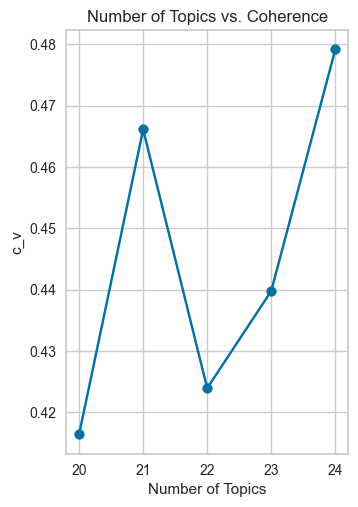

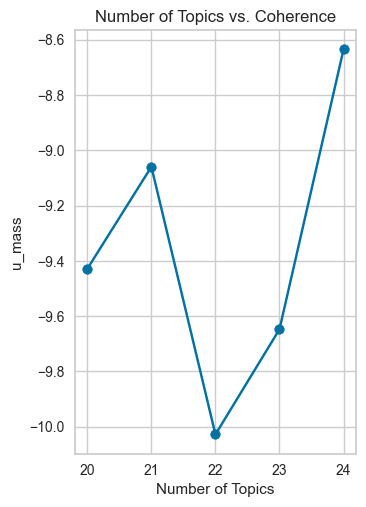

In [131]:
#두개 이어 붙인 거 이_로
reviews_w_ngrams.cleaned_review = reviews_w_ngrams.cleaned_review.map(lambda x: replace_ngram(x) if isinstance(x, str) else x)

# 불용어 처리 추가
print(stop_words)

# 3개 짜리 트리그램 [word1, word2, word3] + 두이어붙인 거에
reviews_w_ngrams = reviews_w_ngrams.cleaned_review.map(lambda x: [word for word in x.split() if word not in stop_words and len(word) > 2] if isinstance(x, str) else x)
reviews_w_ngrams.dropna(axis=0, inplace=True)
reviews_w_ngrams.isnull().sum()

final_reviews = reviews_w_ngrams
final_reviews.dropna(axis=0, inplace=True)

dictionary = corpora.Dictionary(final_reviews)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in final_reviews]

coherence = []
umass = []
px = []

for k in range(20,25):
    print('Round: '+str(k))
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=k, id2word = dictionary, passes=40,\
                iterations=200, chunksize = 10000, eval_every = None, random_state=0)
    
    cm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='c_v')
    mm = gensim.models.coherencemodel.CoherenceModel(model=ldamodel, texts=final_reviews,\
                                                    dictionary=dictionary, coherence='u_mass')
    coherence.append((k,cm.get_coherence()))
    umass.append((k,mm.get_coherence()))
    
    
x_val = [x[0] for x in coherence]
y_val = [x[1] for x in coherence]

x_val_u = [x[0] for x in umass]
y_val_y = [x[1] for x in umass]

plt.subplot(1,2,1)
plt.plot(x_val,y_val)
plt.scatter(x_val,y_val)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('c_v')
plt.xticks(x_val)
plt.show()

plt.subplot(1,2,2)
plt.plot(x_val_u,y_val_y)
plt.scatter(x_val_u,y_val_y)
plt.title('Number of Topics vs. Coherence')
plt.xlabel('Number of Topics')
plt.ylabel('u_mass')
plt.xticks(x_val_u)
plt.show()

In [132]:
for i in range(20,25):
    name = 'pu'
    num = i
    Lda = gensim.models.ldamodel.LdaModel
    ldamodel = Lda(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    Lda2 = gensim.models.ldamodel.LdaModel
    ldamodel2 = Lda2(doc_term_matrix, num_topics=num, id2word = dictionary, passes=40,\
                iterations=200,  chunksize = 10000, eval_every = None, random_state=0)

    # To show initial topics
    ldamodel.show_topics(num, num_words=10, formatted=False)

    # To show initial topics
    ldamodel2.show_topics(num, num_words=10, formatted=False)

    # Visualize the topics
    pyLDAvis.enable_notebook()
    LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+'v3_0129')

    # Create directory if it does not exist
    if not os.path.exists('./results'):
        os.makedirs('./results')

    LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel2, doc_term_matrix, dictionary, mds = 'pcoa')
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
    # load the pre-prepared pyLDAvis data from disk

    with open(LDAvis_data_filepath, 'rb') as f:
        LDAvis_prepared = pickle.load(f)
    pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ f'{name}_{num}' +'.html')
    display(LDAvis_prepared)

    topic_data = LDAvis_prepared
    all_topics = {}
    num_terms = 10  # Adjust number of words to represent each topic
    lambd = 0.6  # Adjust this accordingly based on tuning above

    for j in range(1, num + 1):  # Adjust this to reflect number of topics chosen for final LDA model
        topic = topic_data.topic_info[topic_data.topic_info.Category == 'Topic' + str(j)].copy()
        topic['relevance'] = topic['loglift'] * (1 - lambd) + topic['logprob'] * lambd
        
        # 리스트 길이 보정: max_length 만큼 패딩 (NaN 추가)
        terms = topic.sort_values(by='relevance', ascending=False).Term.tolist()
        all_topics['Topic ' + str(j)] = terms[:num_terms] + [None] * (num_terms - len(terms))

    lda2_test_results = pd.DataFrame.from_dict(all_topics, orient='index')
    display(lda2_test_results)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.133558 -0.027922       1        1  11.036148
17     0.031350  0.117245       2        1   7.843664
10     0.018768 -0.022543       3        1   7.713634
18     0.079086 -0.003686       4        1   6.576258
14     0.031054  0.111338       5        1   5.939355
13     0.108215 -0.010436       6        1   5.829315
12    -0.020015  0.050194       7        1   5.725705
1     -0.136117 -0.193259       8        1   5.022918
3     -0.038774  0.024271       9        1   4.735868
8     -0.027256  0.007994      10        1   4.730077
11     0.078581 -0.031343      11        1   4.564840
9      0.037864 -0.008064      12        1   4.563006
7      0.053076 -0.043960      13        1   4.063882
16    -0.121987  0.069377      14        1   3.948102
6     -0.097484  0.055934      15        1   3.752752
5     -0.048427 -0.004752      16        1   3.352462
19     0.042437 -0.042334      17        1   2.905776
15    -0.103324  0.062917      18        1   2.694072
2     -0.027298 -0.062510      19        1   2.665749
0      0.006692 -0.048460      20        1   2.336418, topic_info=                  Term       Freq      Total Category  logprob  loglift
123          sensitive  44.000000  44.000000  Default  30.0000  30.0000
29              bottle  21.000000  21.000000  Default  29.0000  29.0000
118                oil  17.000000  17.000000  Default  28.0000  28.0000
197                bad  15.000000  15.000000  Default  27.0000  27.0000
162              color  11.000000  11.000000  Default  26.0000  26.0000
188              smell  29.000000  29.000000  Default  25.0000  25.0000
107               face  47.000000  47.000000  Default  24.0000  24.0000
45         moisturizer  20.000000  20.000000  Default  23.0000  23.0000
95                acne  29.000000  29.000000  Default  22.0000  22.0000
68               itchy  13.000000  13.000000  Default  21.0000  21.0000
65                good  24.000000  24.000000  Default  20.0000  20.0000
30        disappointed  15.000000  15.000000  Default  19.0000  19.0000
36                 dry  27.000000  27.000000  Default  18.0000  18.0000
72                 red  20.000000  20.000000  Default  17.0000  17.0000
545             fungal   5.000000   5.000000  Default  16.0000  16.0000
437              hands   4.000000   4.000000  Default  15.0000  15.0000
8                cream  21.000000  21.000000  Default  14.0000  14.0000
1277            sponge   7.000000   7.000000  Default  13.0000  13.0000
40               pores  13.000000  13.000000  Default  12.0000  12.0000
37                felt  19.000000  19.000000  Default  11.0000  11.0000
77               serum  13.000000  13.000000  Default  10.0000  10.0000
119               oily  11.000000  11.000000  Default   9.0000   9.0000
134            barrier   8.000000   8.000000  Default   8.0000   8.0000
51               bumps  10.000000  10.000000  Default   7.0000   7.0000
116       moisturizing  10.000000  10.000000  Default   6.0000   6.0000
150             months   6.000000   6.000000  Default   5.0000   5.0000
28               weeks   7.000000   7.000000  Default   4.0000   4.0000
592           allergic   7.000000   7.000000  Default   3.0000   3.0000
398          breakouts   8.000000   8.000000  Default   2.0000   2.0000
281              scent   6.000000   6.000000  Default   1.0000   1.0000
863            tingled   1.718623   2.367226   Topic1  -5.3922   1.8838
1066            posted   1.718623   2.367226   Topic1  -5.3922   1.8838
423               heal   1.718622   2.367226   Topic1  -5.3922   1.8838
434             tingle   1.718622   2.367226   Topic1  -5.3922   1.8838
1104              paid   1.718621   2.367225   Topic1  -5.3922   1.8838
650           handling   1.718619   2.367223   Topic1  -5.3922   1.8838
849            decided   3.395391   4.795541   Topic1  -4.7113   1.8587
235              fresh   2.557008

,0,1,2,3,4,5,6,7,8,9
Topic 1,face,good,burning,decided,cream,day,fresh,instead,dry,woke
Topic 2,color,smell,smelled,bad,daughter,sensitive,oil,dark,looks,shocked
Topic 3,bumps,painful,arrows,oxidised,therefore,becomes,staple,good,sponge,oils
Topic 4,seemed,dry,oily,based,texture,consistency,jawline,drier,shade,cheaper
Topic 5,vitamin_c,horrible,moisturizer,odor,several,reacted,fridge,awful,cream,redness
Topic 6,sensitive,red,face,clear,clean,breakouts,hot,stings,tingling,deep
Topic 7,phenoxyethanol,allergic,difference,burns,red,fishy,repair,sort,face,chin
Topic 8,sponge,foundation,wrinkles,puff,bacteria,included,emphasises,tone,applicator,pores
Topic 9,layering,kit,cleansing,explanation,spread,size,literally,bottles,alone,serum
Topic 10,pore,cloggers,consider,ounce,google,months,results,yesstyle,consistently,cheek


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.185378  0.024077       1        1  12.404755
20     0.098318  0.066897       2        1  10.302196
10     0.018796 -0.187637       3        1   9.417158
17     0.012886  0.101516       4        1   8.408257
12    -0.023177  0.114547       5        1   7.384822
13     0.114018  0.050297       6        1   6.141100
16    -0.109046  0.088603       7        1   5.070180
18    -0.061152 -0.014737       8        1   4.525938
0      0.070710 -0.039332       9        1   4.415443
11    -0.004206  0.014606      10        1   4.138578
15     0.012779  0.006704      11        1   4.066259
8     -0.104285  0.008742      12        1   3.728747
6     -0.043837  0.041999      13        1   3.103264
2      0.026860 -0.072875      14        1   3.054748
14     0.034382 -0.037727      15        1   2.605437
7      0.013499 -0.045637      16        1   2.600855
9     -0.055272  0.009184      17        1   2.176352
1     -0.067333 -0.037632      18        1   1.789955
3     -0.030389 -0.043530      19        1   1.751547
19     0.000299 -0.015624      20        1   1.627025
5     -0.089226 -0.032441      21        1   1.287385, topic_info=                   Term       Freq      Total Category  logprob  loglift
68                itchy  12.000000  12.000000  Default  30.0000  30.0000
51                bumps  10.000000  10.000000  Default  29.0000  29.0000
65                 good  24.000000  24.000000  Default  28.0000  28.0000
30         disappointed  15.000000  15.000000  Default  27.0000  27.0000
8                 cream  21.000000  21.000000  Default  26.0000  26.0000
123           sensitive  44.000000  44.000000  Default  25.0000  25.0000
188               smell  30.000000  30.000000  Default  24.0000  24.0000
197                 bad  14.000000  14.000000  Default  23.0000  23.0000
95                 acne  31.000000  31.000000  Default  22.0000  22.0000
36                  dry  28.000000  28.000000  Default  21.0000  21.0000
29               bottle  22.000000  22.000000  Default  20.0000  20.0000
107                face  48.000000  48.000000  Default  19.0000  19.0000
72                  red  20.000000  20.000000  Default  18.0000  18.0000
134             barrier   8.000000   8.000000  Default  17.0000  17.0000
314             excited  10.000000  10.000000  Default  16.0000  16.0000
122             redness  12.000000  12.000000  Default  15.0000  15.0000
118                 oil  16.000000  16.000000  Default  14.0000  14.0000
45          moisturizer  21.000000  21.000000  Default  13.0000  13.0000
116        moisturizing  10.000000  10.000000  Default  12.0000  12.0000
214              smells  10.000000  10.000000  Default  11.0000  11.0000
67            irritated   6.000000   6.000000  Default  10.0000  10.0000
437               hands   3.000000   3.000000  Default   9.0000   9.0000
119                oily  11.000000  11.000000  Default   8.0000   8.0000
37                 felt  20.000000  20.000000  Default   7.0000   7.0000
398           breakouts   8.000000   8.000000  Default   6.0000   6.0000
281               scent   5.000000   5.000000  Default   5.0000   5.0000
545              fungal   5.000000   5.000000  Default   4.0000   4.0000
1277             sponge   8.000000   8.000000  Default   3.0000   3.0000
401               since   7.000000   7.000000  Default   2.0000   2.0000
17                great   9.000000   9.000000  Default   1.0000   1.0000
486                pore   3.442002   4.060088   Topic1  -4.8145   1.9219
480            cloggers   2.591608   3.209694   Topic1  -5.0983   1.8732
863             tingled   1.741212   2.359299   Topic1  -5.4960   1.7833
423                heal   1.741212   2.359298   Topic1  -5.4960   1.7833
434              tingle   1.741212   2.359298   Topic1  -5.4960   1.7833
419               given   1.741212   2.359298   Topic1  -5.4960   1.7833
1206          

,0,1,2,3,4,5,6,7,8,9
Topic 1,cream,face,sensitive,forehead,dry,moisturizer,pore,acne,pretty,day
Topic 2,smell,phenoxyethanol,hours,bottle,face,pimples,combination,different,oxidized,fine
Topic 3,sponge,wrinkles,packaging,included,good,old,foundation,bacteria,puff,remove
Topic 4,color,sensitive,felt,gets,sadly,dry,unlike,shocked,ones,turn
Topic 5,redness,difference,effect,smell,dark,odor,completely,moisturizer,fridge,fishy
Topic 6,sensitive,redness,oily,blot,neck,control,burning,helps,yesstyle,face
Topic 7,bottle,correct,filled,lose,partially,elimination,repurchasing,strangely,throwing,mentioned
Topic 8,burns,smells,shade,trash,dries,expected,read,tacky,recommend,serum
Topic 9,bumps,toner,handling,gift,centella,continue,worse,sad,good,tiny
Topic 10,explanation,useless,fragrance_free,kit,moisture,hazel,size,dry,routine,heard


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
10     0.004662 -0.179237       1        1  10.210895
13     0.164499  0.020127       2        1   9.109507
4      0.158540  0.020701       3        1   8.523665
20    -0.079649  0.129602       4        1   5.783928
21    -0.059085  0.140383       5        1   5.683614
7      0.072862  0.020810       6        1   5.594718
14     0.043751  0.090199       7        1   5.563751
17     0.034160  0.045847       8        1   5.289415
9      0.060317 -0.033570       9        1   5.052059
3      0.034876 -0.079721      10        1   4.929946
2      0.007381 -0.026411      11        1   4.129455
12     0.015313  0.011491      12        1   3.965420
1     -0.043348 -0.033204      13        1   3.923542
16    -0.152067 -0.058318      14        1   3.526842
15    -0.035364 -0.006898      15        1   3.513066
19     0.029847 -0.026737      16        1   2.816428
6     -0.044150  0.005357      17        1   2.667624
18     0.004284 -0.002879      18        1   2.621699
11    -0.016134 -0.001908      19        1   2.394780
0     -0.090701  0.014148      20        1   1.823723
8     -0.045463 -0.042429      21        1   1.681329
5     -0.064528 -0.007352      22        1   1.194592, topic_info=                  Term       Freq      Total Category  logprob  loglift
188              smell  28.000000  28.000000  Default  30.0000  30.0000
29              bottle  21.000000  21.000000  Default  29.0000  29.0000
123          sensitive  44.000000  44.000000  Default  28.0000  28.0000
45         moisturizer  21.000000  21.000000  Default  27.0000  27.0000
36                 dry  27.000000  27.000000  Default  26.0000  26.0000
118                oil  16.000000  16.000000  Default  25.0000  25.0000
107               face  48.000000  48.000000  Default  24.0000  24.0000
68               itchy  14.000000  14.000000  Default  23.0000  23.0000
51               bumps  10.000000  10.000000  Default  22.0000  22.0000
30        disappointed  15.000000  15.000000  Default  21.0000  21.0000
8                cream  21.000000  21.000000  Default  20.0000  20.0000
122            redness  12.000000  12.000000  Default  19.0000  19.0000
214             smells  10.000000  10.000000  Default  18.0000  18.0000
72                 red  20.000000  20.000000  Default  17.0000  17.0000
65                good  24.000000  24.000000  Default  16.0000  16.0000
442           forehead   6.000000   6.000000  Default  15.0000  15.0000
95                acne  30.000000  30.000000  Default  14.0000  14.0000
134            barrier   8.000000   8.000000  Default  13.0000  13.0000
463          packaging   8.000000   8.000000  Default  12.0000  12.0000
545             fungal   5.000000   5.000000  Default  11.0000  11.0000
116       moisturizing  11.000000  11.000000  Default  10.0000  10.0000
197                bad  15.000000  15.000000  Default   9.0000   9.0000
92                pump   6.000000   6.000000  Default   8.0000   8.0000
529          something   8.000000   8.000000  Default   7.0000   7.0000
9               seemed   9.000000   9.000000  Default   6.0000   6.0000
335            stopped   6.000000   6.000000  Default   5.0000   5.0000
37                felt  20.000000  20.000000  Default   4.0000   4.0000
437              hands   5.000000   5.000000  Default   3.0000   3.0000
82              wanted   5.000000   5.000000  Default   2.0000   2.0000
83               worse   9.000000   9.000000  Default   1.0000   1.0000
1279          wrinkles   4.230757   4.867474   Topic1  -4.4136   2.1415
1270          included   3.392219   4.028933   Topic1  -4.6345   2.1097
1323              puff   2.553677   3.190391   Topic1  -4.9184   2.0591
1291          bacteria   2.553672   3.190391   Topic1  -4.9184   2.0591
1277            sponge   5.907831   7.986716   Topic1  -4.0797   1.9802
1135            staple   1.715140   2.351847   Topic1  -5.3165   1.96

,0,1,2,3,4,5,6,7,8,9
Topic 1,sponge,wrinkles,packaging,included,old,foundation,bacteria,puff,good,pores
Topic 2,sensitive,pimples,effect,moisturizer,phenoxyethanol,face,redness,acne,breakouts,moisturizing
Topic 3,forehead,dry,face,cream,hand,swollen,tested,woke,day,excited
Topic 4,smell,bottle,consider,ounce,batches,lose,pump,arrived,rotten,short
Topic 5,bumps,moisture,stings,burns,forming,painful,expired,smelled,itchy,light
Topic 6,irritated,disappointed,bad,hydration,face,realized,looking,red,leaves,moisturizer
Topic 7,itchy,itching,moisturizer,horrible,sometimes,odor,retinol,fridge,cream,irritation
Topic 8,sadly,arrows,thinking,later,benefit,dry,notice,small,daughter,felt
Topic 9,sensitive,worse,unpleasant,chance,something,saying,squalane,worth,redness,hours
Topic 10,hands,wet,three,cleansing,completely,oils,shade,expected,moisturizing,bottles


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
4      0.137541 -0.110943       1        1  9.468344
20     0.107811 -0.091763       2        1  6.993563
22    -0.139199 -0.164621       3        1  6.900848
17     0.039497  0.094476       4        1  6.608159
7      0.070082  0.008950       5        1  5.830307
14     0.039903  0.082151       6        1  5.572050
8      0.059005  0.005126       7        1  5.394183
2      0.049010  0.009701       8        1  5.111074
9      0.022753  0.007386       9        1  4.813733
16    -0.071270  0.081834      10        1  4.375921
5     -0.118611  0.061404      11        1  3.992190
13     0.049269 -0.033800      12        1  3.884609
10    -0.119406 -0.085507      13        1  3.868642
18     0.047410 -0.009844      14        1  3.584332
3      0.038702  0.019523      15        1  3.557504
6     -0.030256 -0.084110      16        1  3.429631
12    -0.023864  0.046685      17        1  3.394670
21     0.015609  0.008075      18        1  3.229374
15    -0.015101  0.017414      19        1  2.867058
19     0.010082  0.044413      20        1  2.764462
11    -0.033883  0.071354      21        1  2.079898
1     -0.086614  0.008299      22        1  1.988487
0     -0.048472  0.013798      23        1  0.290962, topic_info=                  Term       Freq      Total Category  logprob  loglift
188              smell  28.000000  28.000000  Default  30.0000  30.0000
118                oil  16.000000  16.000000  Default  29.0000  29.0000
68               itchy  13.000000  13.000000  Default  28.0000  28.0000
123          sensitive  44.000000  44.000000  Default  27.0000  27.0000
30        disappointed  15.000000  15.000000  Default  26.0000  26.0000
36                 dry  28.000000  28.000000  Default  25.0000  25.0000
8                cream  21.000000  21.000000  Default  24.0000  24.0000
72                 red  20.000000  20.000000  Default  23.0000  23.0000
134            barrier   9.000000   9.000000  Default  22.0000  22.0000
29              bottle  21.000000  21.000000  Default  21.0000  21.0000
197                bad  14.000000  14.000000  Default  20.0000  20.0000
51               bumps  10.000000  10.000000  Default  19.0000  19.0000
1277            sponge   7.000000   7.000000  Default  18.0000  18.0000
162              color  11.000000  11.000000  Default  17.0000  17.0000
529          something   8.000000   8.000000  Default  16.0000  16.0000
40               pores  13.000000  13.000000  Default  15.0000  15.0000
45         moisturizer  20.000000  20.000000  Default  14.0000  14.0000
9               seemed   9.000000   9.000000  Default  13.0000  13.0000
214             smells  11.000000  11.000000  Default  12.0000  12.0000
314            excited   9.000000   9.000000  Default  11.0000  11.0000
65                good  23.000000  23.000000  Default  10.0000  10.0000
95                acne  30.000000  30.000000  Default   9.0000   9.0000
92                pump   5.000000   5.000000  Default   8.0000   8.0000
200                old   8.000000   8.000000  Default   7.0000   7.0000
58                days   8.000000   8.000000  Default   6.0000   6.0000
116       moisturizing  11.000000  11.000000  Default   5.0000   5.0000
77               serum  13.000000  13.000000  Default   4.0000   4.0000
545             fungal   5.000000   5.000000  Default   3.0000   3.0000
83               worse  10.000000  10.000000  Default   2.0000   2.0000
592           allergic   6.000000   6.000000  Default   1.0000   1.0000
863            tingled   1.700250   2.339085   Topic1  -5.2497   2.0382
423               heal   1.700249   2.339084   Topic1  -5.2497   2.0382
434             tingle   1.700249   2.339084   Topic1  -5.2497   2.0382
419              given   1.700249   2.339084   Topic1  -5.2497   2.0382
1206          layering   1.700249   2.339084   Topic1  -5.2497   2.0382
1135            staple   1.700249   2.33

,0,1,2,3,4,5,6,7,8,9
Topic 1,dry,face,old,cream,change,forehead,acne,pores,sensitive,day
Topic 2,hands,phenoxyethanol,wet,something,moisturizing,chance,gift,damaged,cream,putting
Topic 3,sponge,wrinkles,foundation,bacteria,puff,included,bumpy,itchy,bumps,applicator
Topic 4,sensitive,color,squalane,smell,shocked,lovely,batches,unlike,light,feels
Topic 5,toner,niacinamide,blot,hydration,batch,later,disappointed,control,helps,realized
Topic 6,different,several,vitamin_c,moisturizer,odor,brightening,weeks,reacted,fridge,sent
Topic 7,face,ounce,consider,practically,cream,sensitive,color,cheek,slight,oxidized
Topic 8,fungal,journey,vitamin_c_serums,acne,barrier,tingling,burned,soothing,months,semi
Topic 9,filled,correct,hazel,barrier,deep,short,worse,bottle,redness,company
Topic 10,pore,cloggers,google,explanation,kit,bottle,results,breakouts,consistently,single


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.102232  0.131240       1        1  10.911869
17     0.091039  0.007769       2        1   6.683146
12     0.069222  0.037650       3        1   6.578345
13     0.072045  0.106580       4        1   6.434481
22     0.068000 -0.020206       5        1   5.735699
16     0.024630 -0.161025       6        1   4.845751
2      0.027354  0.067764       7        1   4.773664
1     -0.223816  0.031741       8        1   4.657329
9     -0.014246  0.039777       9        1   4.404184
10    -0.117745  0.073579      10        1   4.397073
14     0.072209 -0.050511      11        1   4.308902
15     0.030812  0.040768      12        1   4.264849
8      0.024688 -0.082419      13        1   3.743044
7     -0.012697  0.054965      14        1   3.703127
20     0.052870 -0.102278      15        1   3.512184
0     -0.026186  0.020502      16        1   3.183882
3     -0.058631 -0.009766      17        1   2.665375
19    -0.023744  0.031092      18        1   2.584809
18    -0.011299 -0.019877      19        1   2.447547
5      0.000107 -0.047505      20        1   2.447199
21    -0.033033 -0.039608      21        1   2.218511
11    -0.013202  0.007948      22        1   2.166549
23    -0.071095 -0.041716      23        1   1.731059
6     -0.029514 -0.076463      24        1   1.601423, topic_info=                  Term       Freq      Total Category  logprob  loglift
123          sensitive  44.000000  44.000000  Default  30.0000  30.0000
188              smell  29.000000  29.000000  Default  29.0000  29.0000
8                cream  21.000000  21.000000  Default  28.0000  28.0000
72                 red  19.000000  19.000000  Default  27.0000  27.0000
29              bottle  21.000000  21.000000  Default  26.0000  26.0000
51               bumps  10.000000  10.000000  Default  25.0000  25.0000
45         moisturizer  21.000000  21.000000  Default  24.0000  24.0000
107               face  48.000000  48.000000  Default  23.0000  23.0000
118                oil  17.000000  17.000000  Default  22.0000  22.0000
197                bad  15.000000  15.000000  Default  21.0000  21.0000
65                good  23.000000  23.000000  Default  20.0000  20.0000
37                felt  20.000000  20.000000  Default  19.0000  19.0000
68               itchy  13.000000  13.000000  Default  18.0000  18.0000
95                acne  30.000000  30.000000  Default  17.0000  17.0000
1277            sponge   7.000000   7.000000  Default  16.0000  16.0000
441               eyes   7.000000   7.000000  Default  15.0000  15.0000
30        disappointed  15.000000  15.000000  Default  14.0000  14.0000
82              wanted   5.000000   5.000000  Default  13.0000  13.0000
36                 dry  27.000000  27.000000  Default  12.0000  12.0000
116       moisturizing  11.000000  11.000000  Default  11.0000  11.0000
437              hands   4.000000   4.000000  Default  10.0000  10.0000
214             smells  11.000000  11.000000  Default   9.0000   9.0000
472            pimples   7.000000   7.000000  Default   8.0000   8.0000
162              color  10.000000  10.000000  Default   7.0000   7.0000
67           irritated   6.000000   6.000000  Default   6.0000   6.0000
53            centella   6.000000   6.000000  Default   5.0000   5.0000
463          packaging   8.000000   8.000000  Default   4.0000   4.0000
134            barrier   8.000000   8.000000  Default   3.0000   3.0000
121          recommend  12.000000  12.000000  Default   2.0000   2.0000
401              since   7.000000   7.000000  Default   1.0000   1.0000
863            tingled   1.740911   2.388174   Topic1  -5.3680   1.8992
423               heal   1.740910   2.388174   Topic1  -5.3680   1.8992
434             tingle   1.740910   2.388174   Topic1  -5.3680   1.8992
299               heat   1.740909   2.388173   Topic1  -5.3680   1.8992
192           tingling   2.593634

,0,1,2,3,4,5,6,7,8,9
Topic 1,cream,face,sensitive,day,burning,moisturizer,tingling,dry,woke,moisturizing
Topic 2,sensitive,color,smell,daughter,shocked,unlike,lovely,evening,applying,later
Topic 3,smells,face,allergic,pump,shade,changed,done,swollen,expected,weird
Topic 4,oil,phenoxyethanol,acne,oily,moisturizer,blot,lose,pimples,control,oils
Topic 5,bumps,bumpy,worth,painful,itch,raised,stopped,contact,red,supposed
Topic 6,pore,bottle,cloggers,size,breaking,company,filled,google,explanation,kit
Topic 7,fungal,acne,badly,journey,cutting,since,you’re,dry,reacted,barrier
Topic 8,sponge,wrinkles,foundation,bacteria,puff,included,price,packaging,tone,emphasises
Topic 9,chance,hazel,redness,cleanser,past,putting,versa,denigrate,recommending,resistant
Topic 10,staple,arrows,sponge,old,remove,areas,sting,feeling,throw,extra
